# Step 4A — Averaging & statistics across bouts and animals

Fourth stage of the EMG pipeline (the full version, with EMG/spikes). It takes the spike-filtered per-bout CSVs from Step 3 — grouped into `<stim>ms` subfolders — and turns them into stimulus-aligned averages, population figures, and statistics.

**Blocks**
1. **Per-animal summaries** — align each bout to stimulus onset, compute ΔWBF, normalized WBA and spike rate, then average across that animal's bouts and save `summary_<stim>ms.csv` (mean ± SEM + per-trial spike rasters).
2. **Per-animal plots** — a 2-panel figure (traces + raster) for each stimulus duration of one animal.
3. **Cross-animal summaries** — pool the per-animal summaries into population mean ± SEM figures and CSVs.
4. **PSTH-only figures** — cross-animal peristimulus time histograms of spike rate.
5. **Single-CSV spike rate** — quick spike-rate plot for one chosen CSV.
6. **ISI analysis** — inter-spike-interval histograms, peristimulus mean ISI, smoothing comparison, and ECDF + Mann–Whitney epoch comparisons.
7. **Epoch spike-rate stats** — count-based Pre/During/Post rates per animal with paired Wilcoxon / t-tests.

**Inputs:** `output_csv_spikefiltered/<stim>ms/` CSVs (Step 3) and the resulting `summary_*ms.csv` files.  
**Outputs:** summary CSVs, population SVG/PNG figures, and statistics CSVs.

---

# 第四步 A —— 跨片段与跨个体的平均与统计

EMG 流程的第四阶段（完整版，含 EMG／锋电位）。它读取第三步生成、按 `<刺激>ms` 子文件夹分组的、经锋电位筛选的按片段 CSV，将其转化为对齐刺激的平均、群体图与统计。

**各 Block**
1. **单个体汇总** —— 将每个片段对齐到刺激起始，计算 ΔWBF、归一化 WBA 与发放率，再在该个体的各片段间平均，保存 `summary_<刺激>ms.csv`（均值 ± SEM + 逐试次锋电位栅格）。
2. **单个体绘图** —— 对某一个体的每个刺激时长绘制双联图（曲线 + 栅格）。
3. **跨个体汇总** —— 将各个体的汇总汇集为群体均值 ± SEM 的图与 CSV。
4. **仅 PSTH 图** —— 跨个体的发放率刺激周围时间直方图。
5. **单 CSV 发放率** —— 为选定的某个 CSV 快速绘制发放率。
6. **ISI 分析** —— 锋电位间隔（ISI）直方图、刺激周围平均 ISI、平滑方法比较，以及 ECDF + Mann–Whitney 的各时期比较。
7. **分时期发放率统计** —— 基于计数的每个体 Pre／During／Post 发放率，配对 Wilcoxon／t 检验。

**输入：** `output_csv_spikefiltered/<刺激>ms/` 的 CSV（第三步）以及由此生成的 `summary_*ms.csv`。  
**输出：** 汇总 CSV、群体 SVG/PNG 图，以及统计 CSV。

# Block 1: Load and process spike-filtered CSV data across stimulus folders

This block loads each CSV, aligns time to stimulus onset, computes baseline / delta metrics, normalizes wing beat amplitude, and saves summary CSV outputs.

**中文：** 本 Block 通过 `NeuralDataAnalyzer` 类处理一个个体的每个 `<刺激>ms` 子文件夹：读取每个片段 CSV，将时间对齐到刺激起始，计算基线 WBF 并得到 ΔWBF，将 WBA 归一化到基线（=100%），把所有片段重采样到共同时间轴，跨片段求均值 ± SEM，并保存 `summary_<刺激>ms.csv`（含逐试次锋电位计数列以供后续栅格图）。

In [1]:
# Step 1: Summarizing all csv files that are automatically and manually filtered.

import os
import pandas as pd
import numpy as np
from pathlib import Path
import logging
from typing import List, Tuple, Dict
from scipy import stats
from scipy import interpolate
from tqdm.auto import tqdm

# Set up logging
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)

class NeuralDataAnalyzer:
    def __init__(self, base_dir: str):
        self.base_dir = Path(base_dir)
        self.baseline_start = -2  # seconds
        self.baseline_end = 0     # seconds

    def get_subfolder_paths(self) -> List[Path]:
        """Get all subfolders ending with 'ms'."""
        try:
            folders = [
                d for d in self.base_dir.iterdir() 
                if d.is_dir() and d.name.endswith('ms')
            ]
            folders.sort(key=lambda x: int(x.name.split('ms')[0]))  # Sort by ms value
            return folders
        except Exception as e:
            logging.error(f"Error accessing directory {self.base_dir}: {e}")
            return []
        
    def find_stim_start(self, df: pd.DataFrame) -> float:
        """Find stimulus start time handling both regular and 0ms cases."""
        if df['Opto Stimulus'].max() > 0:
            # Regular case - find first non-zero stimulus
            stim_start_idx = (df['Opto Stimulus'] > 0).idxmax()
            return df.loc[stim_start_idx, 'Time (s)']
        else:
            # 0ms case - find where time crosses zero
            time_series = df['Time (s)'].values
            zero_crossing_idx = np.where(np.diff(np.signbit(time_series)))[0][0]
            return time_series[zero_crossing_idx]

    def load_and_align_data(self, csv_path: Path) -> pd.DataFrame:
        """Load and align a single CSV file."""
        try:
            df = pd.read_csv(csv_path)
            logging.info(f"Loaded {csv_path.name} with shape {df.shape}")
            
            # Find stimulus start time
            stim_start_time = self.find_stim_start(df)
            logging.info(f"Found stimulus start at t = {stim_start_time:.4f}s")
            
            # Align time to stimulus onset
            df['Time (s)'] = df['Time (s)'] - stim_start_time
            
            logging.info(f"Time range after alignment: {df['Time (s)'].min():.2f} to {df['Time (s)'].max():.2f}")
            return df
            
        except Exception as e:
            logging.error(f"Error processing {csv_path}: {e}")
            return pd.DataFrame()

    def calculate_baseline_wbf(self, df: pd.DataFrame) -> float:
        """Calculate baseline wingbeat frequency."""
        mask = (df['Time (s)'] >= self.baseline_start) & (df['Time (s)'] < self.baseline_end)
        baseline = df.loc[mask, 'Wingbeat Frequency'].mean()
        logging.info(f"Calculated baseline WBF: {baseline:.2f} Hz")
        return baseline

    def find_common_timepoints(self, dfs: List[pd.DataFrame]) -> np.ndarray:
        """Find common timepoints across all dataframes."""
        # Get all unique timepoints from all dataframes
        all_times = np.unique(np.concatenate([df['Time (s)'].values for df in dfs]))
        
        # Find the common time range
        max_start = max(df['Time (s)'].min() for df in dfs)
        min_end = min(df['Time (s)'].max() for df in dfs)
        
        # Filter timepoints to common range
        common_times = all_times[(all_times >= max_start) & (all_times <= min_end)]
        common_times.sort()
        
        return common_times

    def resample_to_common_timepoints(self, df: pd.DataFrame, common_times: np.ndarray) -> pd.DataFrame:
        """Resample a dataframe to common timepoints."""
        resampled = pd.DataFrame()
        resampled['Time (s)'] = common_times
        
        for col in df.columns:
            if col == 'Time (s)':
                continue
            elif col in ['Spike Count', 'Opto Stimulus']:
                # Use nearest neighbor for discrete variables
                f = interpolate.interp1d(df['Time (s)'], df[col], kind='nearest',
                                       bounds_error=False, fill_value=0)
            else:
                # Use linear interpolation for continuous variables
                f = interpolate.interp1d(df['Time (s)'], df[col], kind='linear',
                                       bounds_error=False, fill_value=np.nan)
            resampled[col] = f(common_times)
            
        return resampled

    def process_single_folder(self, folder_path: Path) -> pd.DataFrame:
        """Process all CSV files in a single folder."""
        csv_files = list(folder_path.glob('*.csv'))
        if not csv_files:
            logging.warning(f"No CSV files found in {folder_path}")
            return pd.DataFrame()
            
        aligned_dfs = []
        
        for csv_file in tqdm(csv_files, desc=f"Processing {folder_path.name}", leave=False):
            if 'summary' in csv_file.name:
                continue
                
            df = self.load_and_align_data(csv_file)
            if df.empty:
                continue
                
            # Calculate and subtract baseline WBF
            baseline = self.calculate_baseline_wbf(df)
            df['Delta Wingbeat Frequency'] = df['Wingbeat Frequency'] - baseline

            # ==============================================================
            # NEW: normalize Wing Beat Amplitude to baseline average
            # ==============================================================
            baseline_mask = (df['Time (s)'] >= self.baseline_start) & (df['Time (s)'] < self.baseline_end)
            baseline_wba = df.loc[baseline_mask, 'Wing Beat Amplitude'].mean()
            if baseline_wba and not np.isnan(baseline_wba) and baseline_wba != 0:
                df['Normalized Wing Beat Amplitude'] = (df['Wing Beat Amplitude'] / baseline_wba) * 100
            else:
                df['Normalized Wing Beat Amplitude'] = np.nan
            logging.info(f"Baseline WBA: {baseline_wba:.3f} (normalized to 100%)")
            # ==============================================================

            trial_num = len(aligned_dfs) + 1
            df = df.rename(columns={'Spike Count': f'Spike Count Trial {trial_num}'})
            aligned_dfs.append(df)
        
        if not aligned_dfs:
            logging.warning(f"No valid data found in {folder_path}")
            return pd.DataFrame()
        
        # Find common timepoints and resample all dataframes
        common_times = self.find_common_timepoints(aligned_dfs)
        resampled_dfs = [self.resample_to_common_timepoints(df, common_times) for df in aligned_dfs]
        
        summary_df = pd.DataFrame()
        summary_df['Time (s)'] = common_times
        
        # ==============================================================
        # Original metrics (unchanged)
        # ==============================================================
        metrics = ['Delta Wingbeat Frequency', 'Wing Beat Amplitude', 'Spike Rate']
        for metric in metrics:
            values = np.array([df[metric].values for df in resampled_dfs])
            mean = np.nanmean(values, axis=0)
            sem = stats.sem(values, axis=0, nan_policy='omit')
            
            summary_df[f'Mean {metric}'] = mean
            summary_df[f'SEM {metric}'] = sem
            
            logging.info(f"{metric} summary stats:")
            logging.info(f"Mean range: {np.nanmin(mean):.2f} to {np.nanmax(mean):.2f}")
        # ==============================================================

        # ==============================================================
        # NEW: add normalized amplitude summary (without altering others)
        # ==============================================================
        norm_values = np.array([df['Normalized Wing Beat Amplitude'].values for df in resampled_dfs])
        norm_mean = np.nanmean(norm_values, axis=0)
        norm_sem = stats.sem(norm_values, axis=0, nan_policy='omit')
        summary_df['Mean Normalized Wing Beat Amplitude'] = norm_mean
        summary_df['SEM Normalized Wing Beat Amplitude'] = norm_sem
        # ==============================================================

        # Add individual trial spike counts
        for i, df in enumerate(resampled_dfs, 1):
            summary_df[f'Spike Count Trial {i}'] = df[f'Spike Count Trial {i}']
        
        summary_df['Opto Stimulus'] = resampled_dfs[0]['Opto Stimulus']
        
        return summary_df

    def process_all_folders(self):
        subfolders = self.get_subfolder_paths()
    
        for folder in tqdm(subfolders, desc="Processing folders", unit="folder"):
            summary_df = self.process_single_folder(folder)
        
            if not summary_df.empty:
                # Save in main directory instead of subfolder
                output_path = self.base_dir.parent / f'summary_{folder.name}.csv'
                summary_df.to_csv(output_path, index=False)
                logging.info(f"Saved summary to: {output_path}")

def main():
    # This is the "output_csv_filtered" folder.
    base_dir = Path('/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR/260516_SpMN4_A1ACR_EMG_Fly1/output_csv_spikefiltered')
    
    try:
        analyzer = NeuralDataAnalyzer(base_dir)
        analyzer.process_all_folders()
        logging.info("Analysis completed successfully")
        
    except Exception as e:
        logging.error(f"Analysis failed: {e}")

if __name__ == "__main__":
    main()

Processing folders:   0%|          | 0/2 [00:00<?, ?folder/s]

Processing 0ms:   0%|          | 0/6 [00:00<?, ?it/s]

2026-05-16 21:48:10,002 - INFO - Loaded 2026_0516_100141_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial1_3000msx3_thorax_bout4_stim0ms.csv with shape (400000, 11)
2026-05-16 21:48:10,003 - INFO - Found stimulus start at t = -0.0001s
2026-05-16 21:48:10,004 - INFO - Time range after alignment: -5.00 to 15.00
2026-05-16 21:48:10,005 - INFO - Calculated baseline WBF: 231.23 Hz
2026-05-16 21:48:10,007 - INFO - Baseline WBA: 6.912 (normalized to 100%)
2026-05-16 21:48:10,161 - INFO - Loaded 2026_0516_100141_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial1_3000msx3_thorax_bout1_stim0ms.csv with shape (400000, 11)
2026-05-16 21:48:10,162 - INFO - Found stimulus start at t = -0.0001s
2026-05-16 21:48:10,163 - INFO - Time range after alignment: -5.00 to 15.00
2026-05-16 21:48:10,164 - INFO - Calculated baseline WBF: 225.61 Hz
2026-05-16 21:48:10,165 - INFO - Baseline WBA: 6.994 (normalized to 100%)
2026-05-16 21:48:10,316 - INFO - Loaded 2026_0516_100141_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial1_3000msx3

Processing 3000ms:   0%|          | 0/12 [00:00<?, ?it/s]

2026-05-16 21:48:17,929 - INFO - Loaded 2026_0516_101540_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial2_3000msx3_thorax_bout6_stim3000ms.csv with shape (400000, 11)
2026-05-16 21:48:17,931 - INFO - Found stimulus start at t = 0.0000s
2026-05-16 21:48:17,932 - INFO - Time range after alignment: -5.00 to 15.00
2026-05-16 21:48:17,932 - INFO - Calculated baseline WBF: 236.64 Hz
2026-05-16 21:48:17,934 - INFO - Baseline WBA: 6.127 (normalized to 100%)
2026-05-16 21:48:18,085 - INFO - Loaded 2026_0516_101540_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial2_3000msx3_thorax_bout9_stim3000ms.csv with shape (399999, 11)
2026-05-16 21:48:18,086 - INFO - Found stimulus start at t = 0.0000s
2026-05-16 21:48:18,087 - INFO - Time range after alignment: -5.00 to 15.00
2026-05-16 21:48:18,088 - INFO - Calculated baseline WBF: 237.64 Hz
2026-05-16 21:48:18,089 - INFO - Baseline WBA: 6.118 (normalized to 100%)
2026-05-16 21:48:18,237 - INFO - Loaded 2026_0516_101540_SpMN4_A1ACR_IS76603_A1ACR_4d_F_Fly1_Trial2_3000

# Block 2: Define single-folder summary plotting and plot summary files

This block defines the plotting function for one folder of summary CSVs and then generates plots for each stimulus duration in the selected folder.

**中文：** 本 Block 定义 `plot_summary`（针对单个文件夹内的汇总 CSV 的绘图函数），生成一张双联图——上图为 ΔWBF、发放率与归一化 WBA（三 y 轴），下图为逐试次锋电位栅格，并叠加刺激阴影——随后对所选文件夹中的每个刺激时长各画一张。

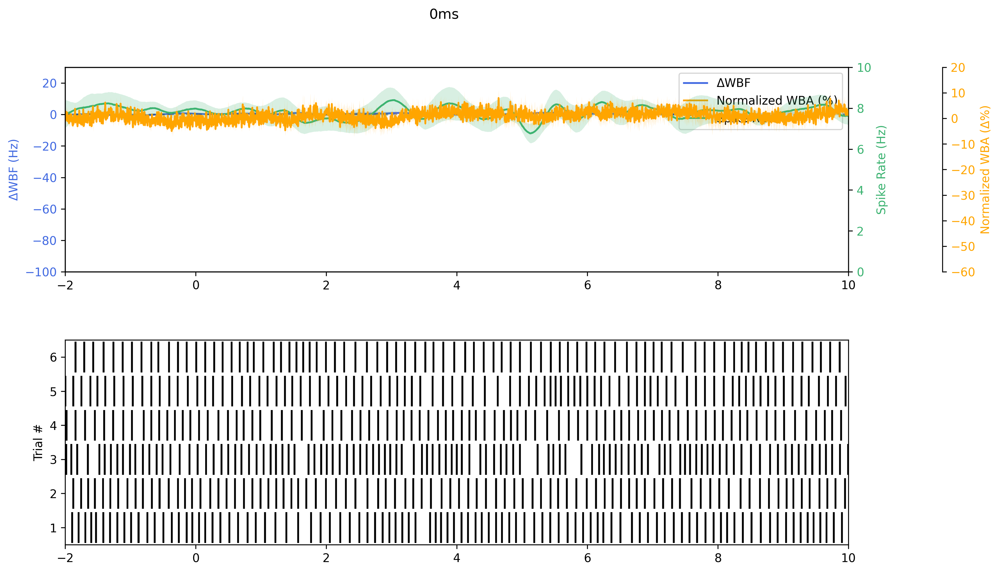

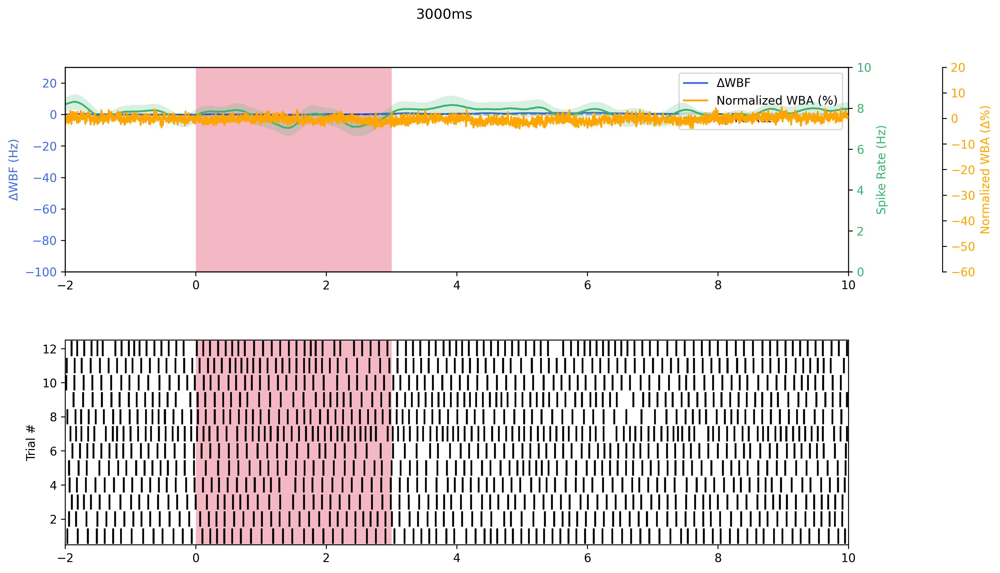

In [2]:
# Step 2: Generate a summary plot for inspection.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['savefig.dpi'] = 300

def plot_summary(summary_file: Path, stimcolor, time_window=(-5, 15), save_fig=True) -> None:
    """
    Create a high-resolution two-panel plot for a summary data file.
    """
    # Read data
    df = pd.read_csv(summary_file)
    
    # Get stimulus duration from filename
    stim_duration = summary_file.stem.split('_')[1]  # Gets the 'Xms' part
    
    # Filter data to time window
    mask = (df['Time (s)'] >= time_window[0]) & (df['Time (s)'] <= time_window[1])
    df_window = df[mask].copy()
    time = df_window['Time (s)'].values
    
    # Create figure
    fig = plt.figure(figsize=(12, 10), dpi=300)
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 2, 1], hspace=0.4)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])
    
    # First subplot
    ax1.grid(False)
    
    # WBF on left axis (blue)
    ax1.plot(time, df_window['Mean Delta Wingbeat Frequency'], 
             color='royalblue', label='ΔWBF')
    ax1.fill_between(time,
                     df_window['Mean Delta Wingbeat Frequency'] - df_window['SEM Delta Wingbeat Frequency'],
                     df_window['Mean Delta Wingbeat Frequency'] + df_window['SEM Delta Wingbeat Frequency'],
                     color='royalblue', alpha=0.2, linewidth=0)
    ax1.set_ylabel('ΔWBF (Hz)', color='royalblue')
    ax1.tick_params(axis='y', labelcolor='royalblue')
    ax1.set_ylim(-100, 30)
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)

    # Spike Rate on second twin axis (green)
    ax1_spike = ax1.twinx()
    ax1_spike.grid(False)
    ax1_spike.plot(time, df_window['Mean Spike Rate'], 
                   color='mediumseagreen', label='Spike Rate')
    ax1_spike.fill_between(time,
                           df_window['Mean Spike Rate'] - df_window['SEM Spike Rate'],
                           df_window['Mean Spike Rate'] + df_window['SEM Spike Rate'],
                           color='mediumseagreen', alpha=0.2, linewidth=0)
    ax1_spike.set_ylabel('Spike Rate (Hz)', color='mediumseagreen')
    ax1_spike.tick_params(axis='y', labelcolor='mediumseagreen')
    ax1_spike.set_ylim(0, 10)

    # <<< added: third axis for normalized WBA
    ax1_amp = ax1.twinx()
    ax1_amp.spines["right"].set_position(("axes", 1.12))
    ax1_amp.set_zorder(ax1_spike.get_zorder() + 1)   # bring front
    ax1_amp.grid(False)
    if 'Mean Normalized Wing Beat Amplitude' in df_window.columns:
        wba_mean = df_window['Mean Normalized Wing Beat Amplitude'] - 100  # <<< shift to Δ%
        wba_sem  = df_window['SEM Normalized Wing Beat Amplitude']
        ax1_amp.plot(time, wba_mean, color='orange', label='Normalized WBA (%)')
        ax1_amp.fill_between(time, wba_mean - wba_sem, wba_mean + wba_sem,
                            color='orange', alpha=0.2, linewidth=0)
        ax1_amp.set_ylabel('Normalized WBA (Δ%)', color='orange')
        ax1_amp.tick_params(axis='y', labelcolor='orange')
        ax1_amp.set_ylim(-60, 20)
    # <<< end added section


    # Add stimulus shading
    ymin, ymax = ax1.get_ylim()
    ax1.fill_between(time, ymin, ymax,
                     where=df_window['Opto Stimulus'] > 0,
                     color=stimcolor, alpha=0.3, linewidth=0)
    
    # Add legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax1_amp.get_legend_handles_labels() if 'ax1_amp' in locals() else ([], [])
    lines3, labels3 = ax1_spike.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3,
               labels1 + labels2 + labels3,
               loc='upper right')
    
    # Second subplot: Spike raster
    ax2.grid(False)
    spike_columns = [col for col in df_window.columns if 'Spike Count Trial' in col]
    n_trials = len(spike_columns)
    
    for i, col in enumerate(spike_columns):
        spikes = df_window[col].values
        spike_diff = np.diff(spikes)
        spike_indices = np.where(spike_diff > 0)[0]
        spike_times = time[spike_indices]
        ax2.eventplot(spike_times, lineoffsets=i+1, linelengths=0.9, color='black')
    
    ax2.fill_between(time, 0, n_trials + 1,
                     where=df_window['Opto Stimulus'] > 0,
                     color=stimcolor, alpha=0.3, linewidth=0)
    
    ax2.set_ylim(0.5, n_trials + 0.5)
    ax2.set_ylabel('Trial #')
    
    for ax in [ax1, ax2]:
        ax.set_xlim(time_window)
    
    fig.suptitle(f"{stim_duration}", y=0.95)
    
    if save_fig:
        output_path = summary_file.parent / f'visualization_{stim_duration}.png'
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
    
    plt.show()


# This is the xxx_Fly1_Y folder
base_folder = Path('/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR/260516_SpMN4_A1ACR_EMG_Fly1_Y')

# Plot all summary files directly from the base folder
# Sort files by stimulus duration numerically
summary_files = sorted(
    base_folder.glob('summary_*ms.csv'),
    key=lambda x: int(x.stem.split('_')[1].rstrip('ms'))
)

for summary_file in summary_files:
    plot_summary(summary_file, 'crimson', time_window=(-2, 10))

# Block 3: Define cross-animal summary plotting and gather summary files

This block defines plotting utilities for combining summary files across animals, discovers fly folders, groups files by stimulus duration, and generates cross-animal summary figures.

**中文：** 本 Block 定义跨个体合并汇总文件的绘图工具，发现各果蝇文件夹，按刺激时长对 `summary_*ms.csv` 分组，并为每个刺激时长生成跨个体的群体汇总图（ΔWBF／发放率／归一化 WBA 的均值 ± SEM、合并栅格，以及单独的发放率面板），同时保存对应的合并 CSV。

Found 11 fly folders
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/250307_spMN4_ChR_EMG_Fly2_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/260511_spMN4_ChR_EMG_Fly4_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/260511_spMN4_ChR_EMG_Fly3_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/251226_spMN4_ChR_EMG_Fly3_Y
/Users/camellyc/Library/CloudStorage/GoogleDriv

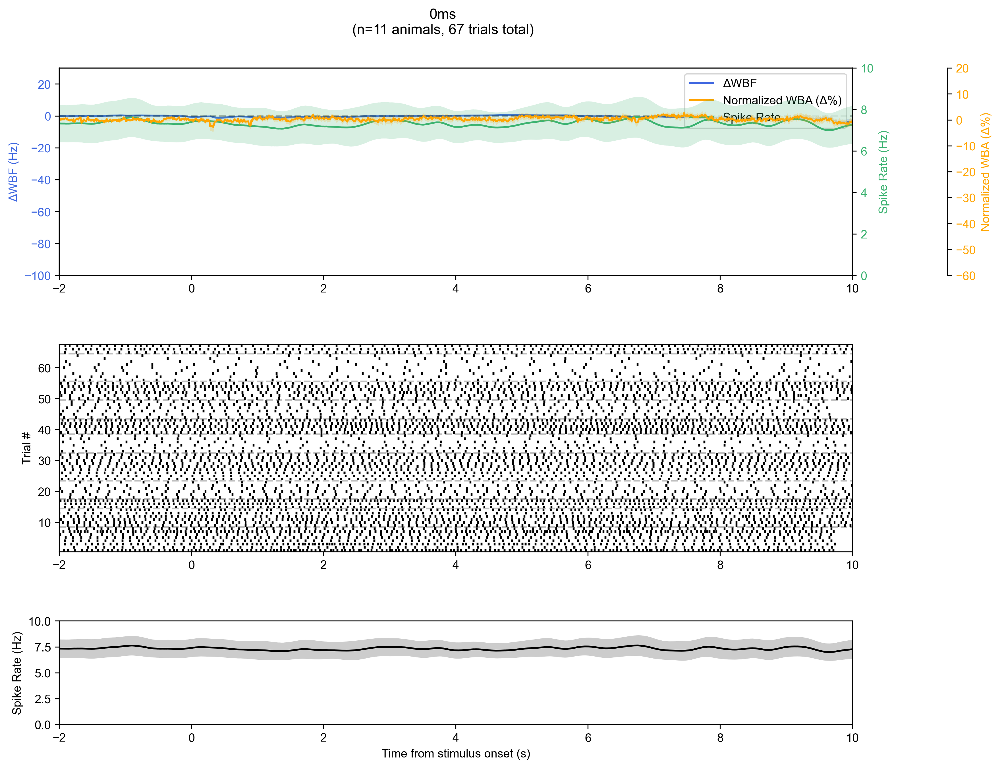


Processing 100ms (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_100ms.csv


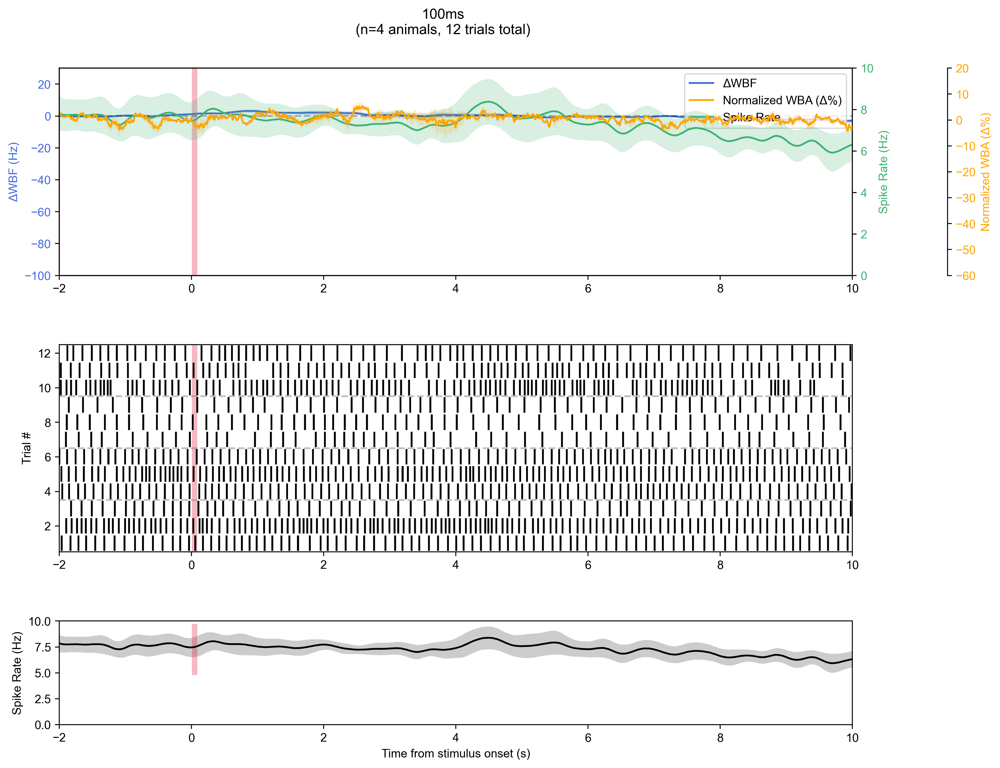


Processing 300ms (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_300ms.csv


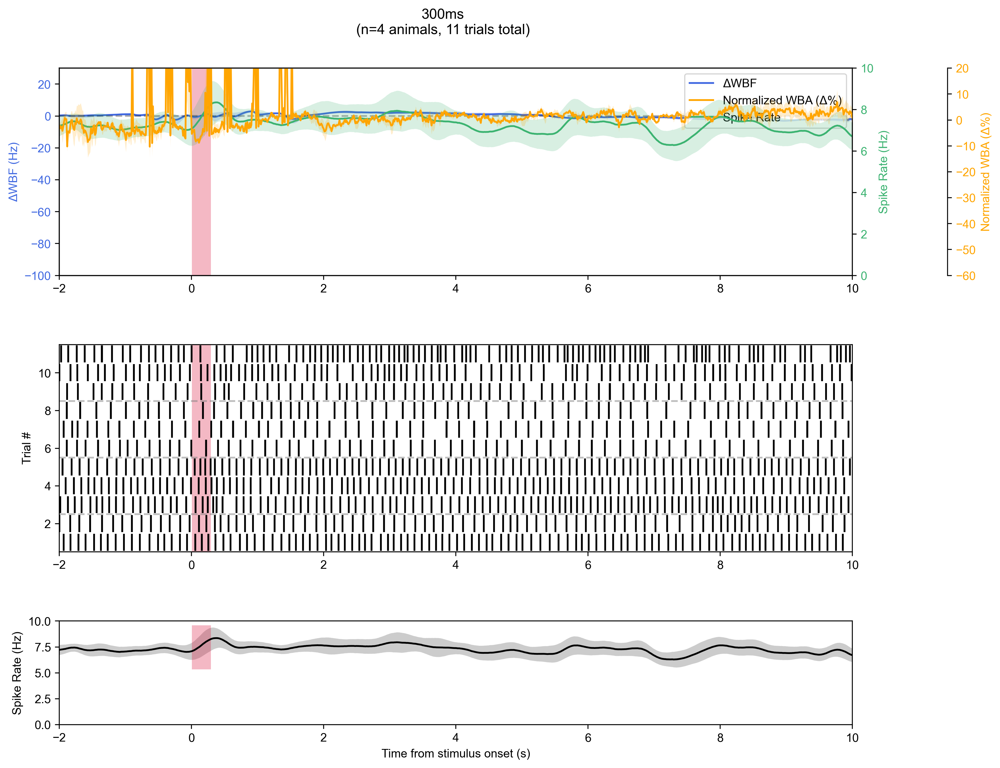


Processing 1000ms (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_1000ms.csv


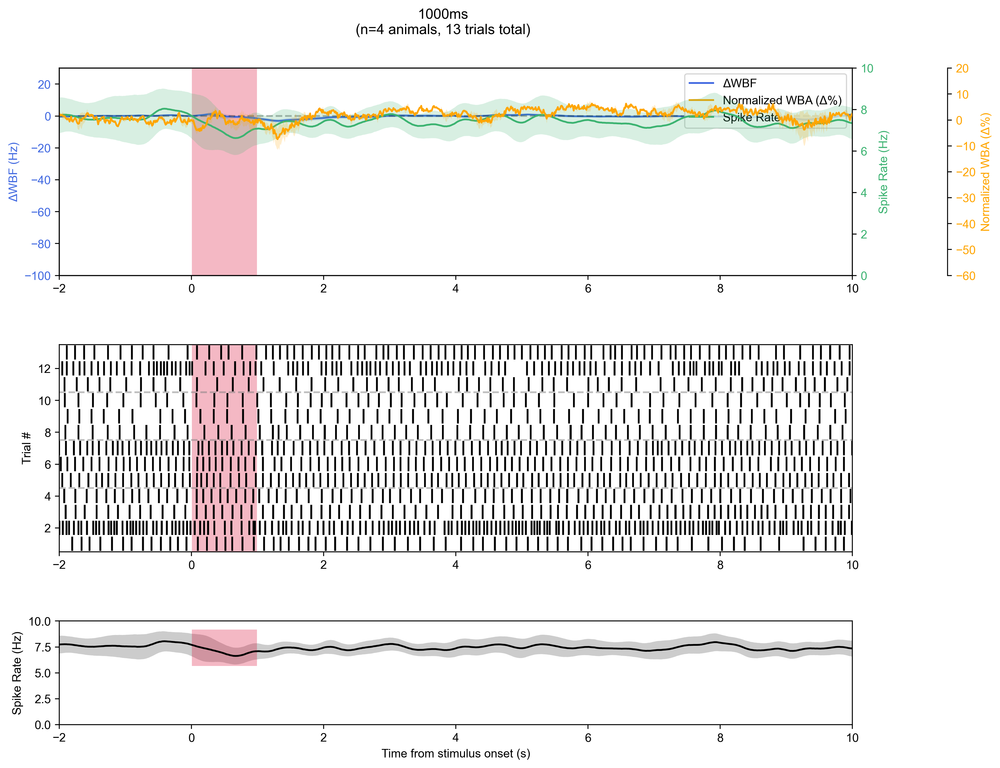


Processing 1500ms (found in 1 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_1500ms.csv


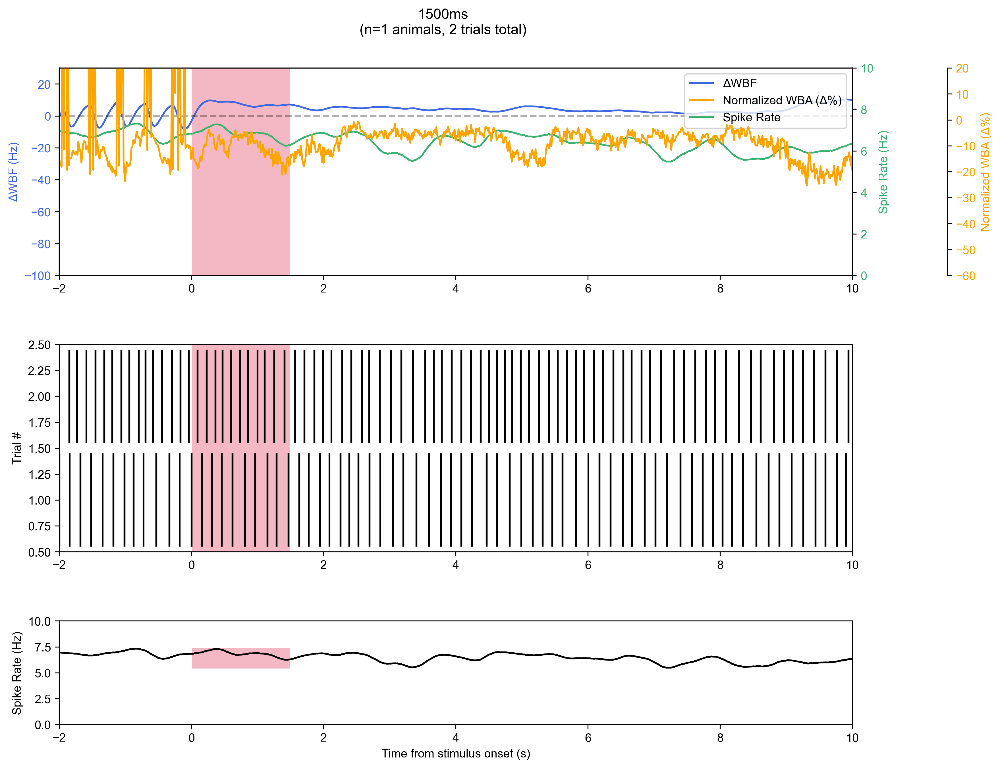


Processing 2000ms (found in 1 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_2000ms.csv


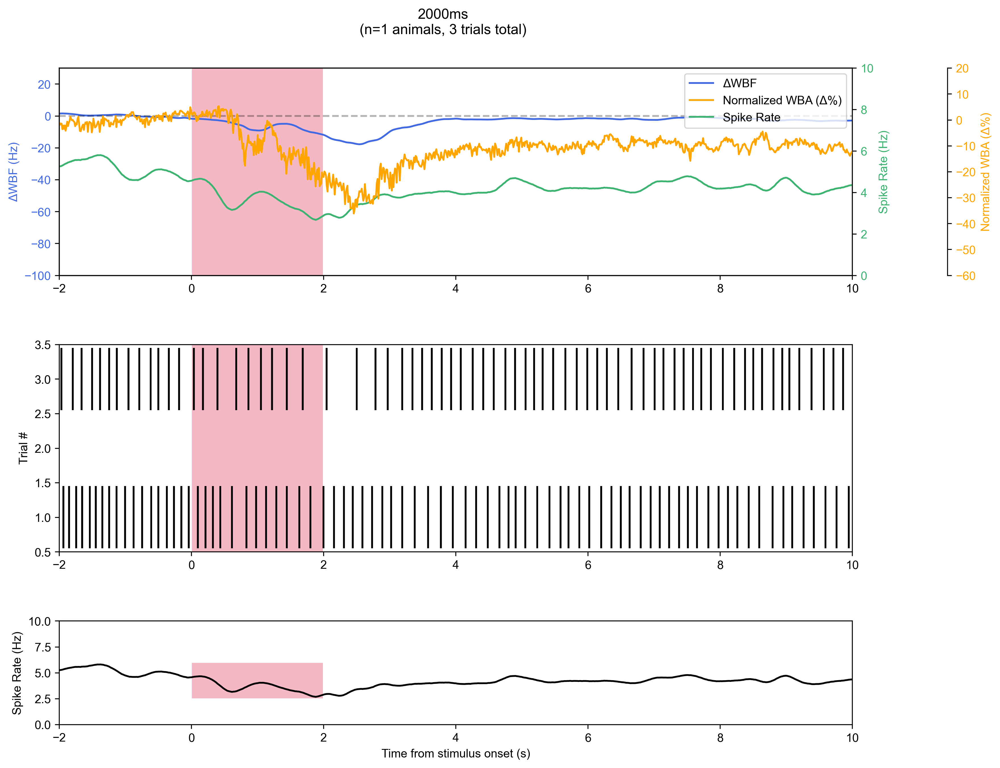


Processing 3000ms (found in 11 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_3000ms.csv


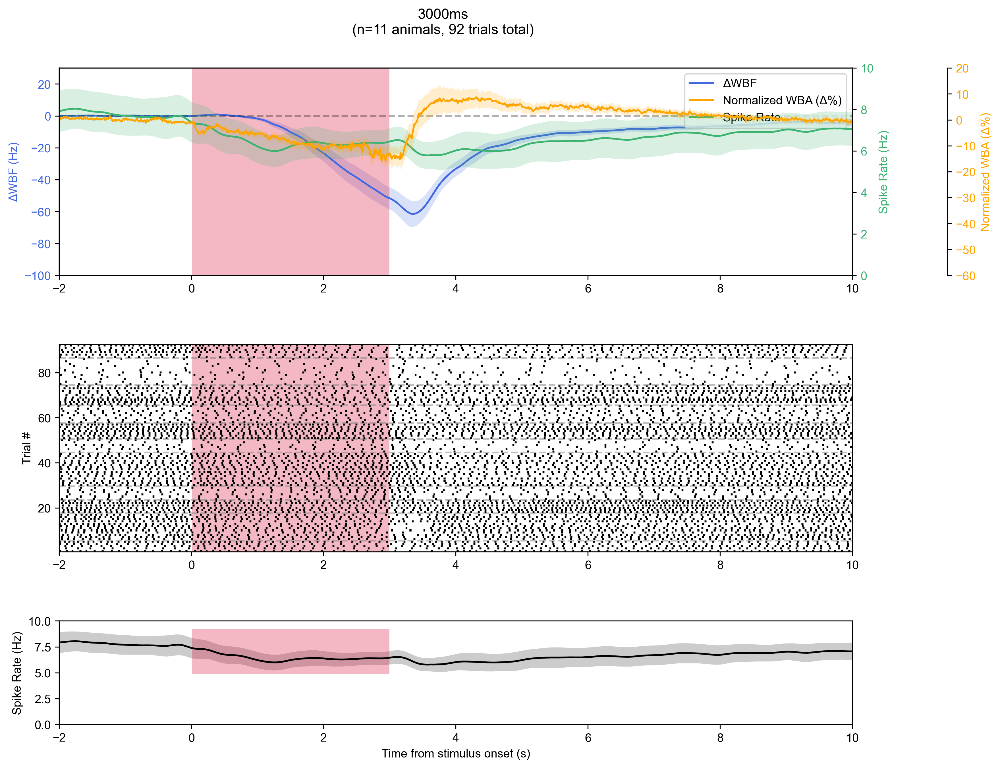


Processing 5000ms (found in 3 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_5000ms.csv


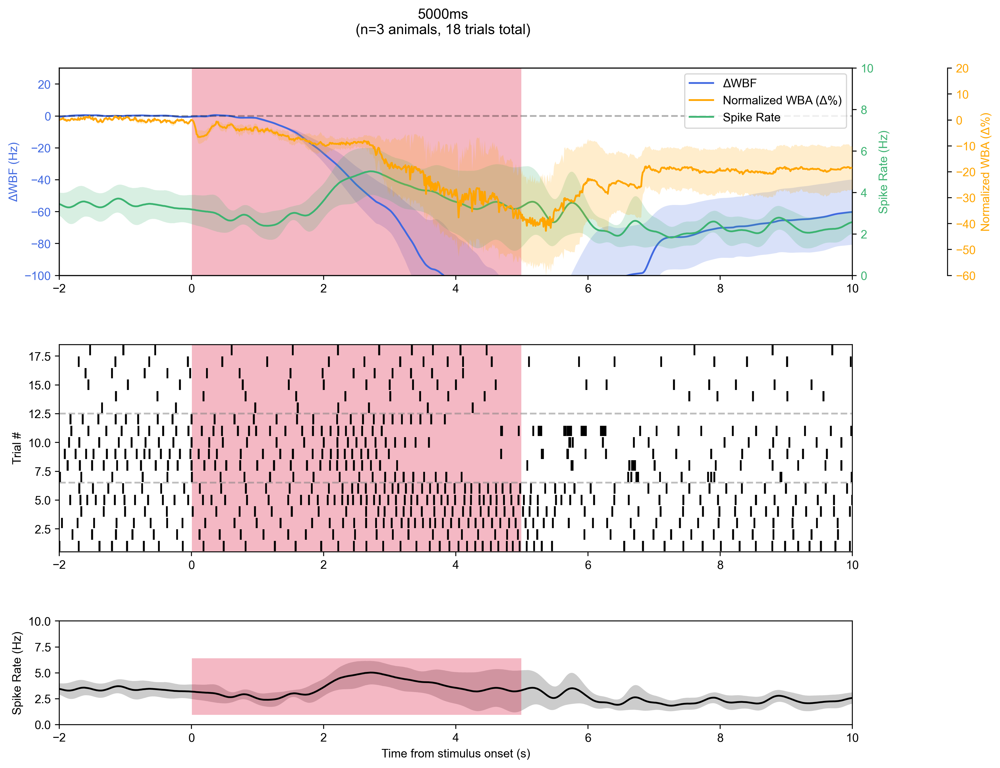


Processing 10000ms (found in 6 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_10000ms.csv


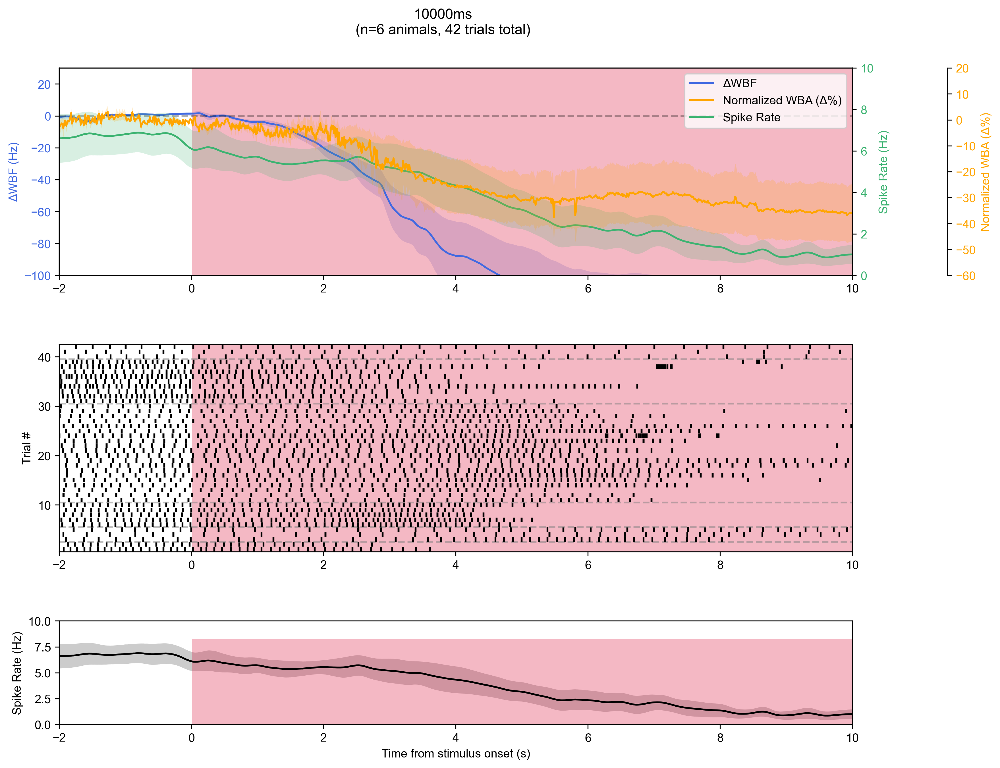

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm

import matplotlib as mpl
from spiracle_helper_functions import set_plot_style
set_plot_style()  # Affinity/Illustrator-safe SVG fonts (Arial, editable text)

# Main directory containing all fly folders
main_directory = '/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR'
main_path = Path(main_directory)

def get_stim_color(directory_path: str) -> str:
    """
    Determine the appropriate stimulation color based on the directory name.
    """
    if 'ChR' in directory_path:
        return 'crimson'
    elif 'GtACR' in directory_path:
        return 'lightgreen'
    else:
        return 'lightgray'  # default color if neither is found

def plot_cross_animal_summary(stim_files: list, time_window=(-2, 10), save_fig=True) -> None:
    """
    Create summary plot across animals for a given stimulus duration.
    """
    stim_color = get_stim_color(str(main_path))
    
    # Read and combine data from all animals
    all_dfs = []
    for file in stim_files:
        df = pd.read_csv(file)
        mask = (df['Time (s)'] >= time_window[0]) & (df['Time (s)'] <= time_window[1])
        df_window = df[mask].copy()
        all_dfs.append(df_window)
    
    # Interpolate to common timebase
    time = np.linspace(time_window[0], time_window[1], 1000)
    interpolated_data = []
    
    for df in all_dfs:
        interp_df = pd.DataFrame()
        interp_df['Time (s)'] = time
        for col in df.columns:
            if col == 'Time (s)':
                continue
            if col.startswith('Spike Count'):
                f = lambda x: np.interp(x, df['Time (s)'], df[col], left=0, right=0)
            else:
                f = lambda x: np.interp(x, df['Time (s)'], df[col])
            interp_df[col] = f(time)
        interpolated_data.append(interp_df)
    
    # Calculate mean ± SEM across animals
    combined_df = pd.DataFrame()
    combined_df['Time (s)'] = time
    
    metrics = [
        'Mean Delta Wingbeat Frequency',
        'Mean Spike Rate',
        'Mean Normalized Wing Beat Amplitude'  # <<< added
    ]
    for metric in metrics:
        values = np.array([df[metric] for df in interpolated_data if metric in df.columns])
        if values.size == 0:
            continue
        combined_df[metric] = np.mean(values, axis=0)
        sem_name = f'SEM {metric.split("Mean ")[-1]}'
        sem_values = np.std(values, axis=0) / np.sqrt(len(values))
        combined_df[sem_name] = sem_values
    
    combined_df['Opto Stimulus'] = interpolated_data[0]['Opto Stimulus']
    
    # Get stimulus duration from first file name
    stim_duration = stim_files[0].stem.split('_')[1]
    n_animals = len(all_dfs)

    # --- plotting ---
    fig = plt.figure(figsize=(12, 10), dpi=300)
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 2, 1], hspace=0.4)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])
    ax3 = fig.add_subplot(gs[2])
    
    ax1.grid(False)
    
    # ΔWBF (blue)
    ax1.plot(time, combined_df['Mean Delta Wingbeat Frequency'], color='royalblue', label='ΔWBF')
    ax1.fill_between(time,
                     combined_df['Mean Delta Wingbeat Frequency'] - combined_df['SEM Delta Wingbeat Frequency'],
                     combined_df['Mean Delta Wingbeat Frequency'] + combined_df['SEM Delta Wingbeat Frequency'],
                     color='royalblue', alpha=0.2, linewidth=0)
    ax1.set_ylabel('ΔWBF (Hz)', color='royalblue')
    ax1.tick_params(axis='y', labelcolor='royalblue')
    ax1.set_ylim(-100, 30)
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    
    # Spike rate (green)
    ax1_spike = ax1.twinx()
    ax1_spike.grid(False)
    ax1_spike.plot(time, combined_df['Mean Spike Rate'], color='mediumseagreen', label='Spike Rate')
    ax1_spike.fill_between(time,
                           combined_df['Mean Spike Rate'] - combined_df['SEM Spike Rate'],
                           combined_df['Mean Spike Rate'] + combined_df['SEM Spike Rate'],
                           color='mediumseagreen', alpha=0.2, linewidth=0)
    ax1_spike.set_ylabel('Spike Rate (Hz)', color='mediumseagreen')
    ax1_spike.tick_params(axis='y', labelcolor='mediumseagreen')
    ax1_spike.set_ylim(0, 10)

    # <<< added: Normalized WBA (orange)
    if 'Mean Normalized Wing Beat Amplitude' in combined_df.columns:
        ax1_amp = ax1.twinx()
        ax1_amp.spines["right"].set_position(("axes", 1.12))
        ax1_amp.set_zorder(ax1_spike.get_zorder() + 1)
        ax1_amp.grid(False)
        wba_mean = combined_df['Mean Normalized Wing Beat Amplitude'] - 100
        wba_sem = combined_df['SEM Normalized Wing Beat Amplitude']
        ax1_amp.plot(time, wba_mean, color='orange', label='Normalized WBA (Δ%)')
        ax1_amp.fill_between(time, wba_mean - wba_sem, wba_mean + wba_sem,
                             color='orange', alpha=0.2, linewidth=0)
        ax1_amp.set_ylabel('Normalized WBA (Δ%)', color='orange')
        ax1_amp.tick_params(axis='y', labelcolor='orange')
        ax1_amp.set_ylim(-60, 20)
    # <<< end added section

    # Stimulus shading
    ymin, ymax = ax1.get_ylim()
    ax1.fill_between(time, ymin, ymax,
                     where=combined_df['Opto Stimulus'] > 0,
                     color=stim_color, alpha=0.3, linewidth=0)
    
    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = (ax1_amp.get_legend_handles_labels()
                       if 'ax1_amp' in locals() else ([], []))
    lines3, labels3 = ax1_spike.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3,
               labels1 + labels2 + labels3,
               loc='upper right')

    # Second subplot: Update stimulus shading color
    ax2.grid(False)
    current_trial = 0
    
    for animal_idx, df in enumerate(all_dfs):
        spike_columns = [col for col in df.columns if 'Spike Count Trial' in col]
        
        for col in spike_columns:
            spikes = df[col].values
            spike_diff = np.diff(spikes)
            spike_indices = np.where(spike_diff > 0)[0]
            spike_times = df['Time (s)'].values[spike_indices]
            
            current_trial += 1
            ax2.eventplot(spike_times, 
                         lineoffsets=current_trial,
                         linelengths=0.9,
                         color='black')
        
        # Add separator line between animals
        if animal_idx < len(all_dfs) - 1:
            ax2.axhline(y=current_trial + 0.5, color='gray', 
                       linestyle='--', alpha=0.5)
    
    # Update stimulus shading color in raster
    ax2.fill_between(time, 0, current_trial + 1,
                    where=combined_df['Opto Stimulus'] > 0,
                    color=stim_color, alpha=0.3,
                    linewidth=0)
    
    ax2.set_ylim(0.5, current_trial + 0.5)
    ax2.set_ylabel('Trial #')
    
    # Third subplot: Update stimulus shading color
    ax3.grid(False)
    ax3.plot(time, combined_df['Mean Spike Rate'], color='black')
    ax3.fill_between(time,
                    combined_df['Mean Spike Rate'] - combined_df['SEM Spike Rate'],
                    combined_df['Mean Spike Rate'] + combined_df['SEM Spike Rate'],
                    color='black', alpha=0.2,
                    linewidth=0)
    
    # Update stimulus shading color in bottom plot
    ax3.fill_between(time, ax3.get_ylim()[0], ax3.get_ylim()[1],
                    where=combined_df['Opto Stimulus'] > 0,
                    color=stim_color, alpha=0.3,
                    linewidth=0)
    
    ax3.set_ylim(0, 10)
    ax3.set_ylabel('Spike Rate (Hz)')
    ax3.set_xlabel('Time from stimulus onset (s)')
    
    # Set x-axis limits for all subplots
    for ax in [ax1, ax2, ax3]:
        ax.set_xlim(time_window)
    
    n_trials = current_trial
    
    # Add title
    fig.suptitle(f"{stim_duration}\n(n={n_animals} animals, {n_trials} trials total)", 
                y=0.95)
    
    if save_fig:
        # Save SVG
        output_path_svg = main_path / f'summary_across_animals_{stim_duration}.svg'
        plt.savefig(output_path_svg, format='svg', bbox_inches='tight')
        # Save CSV with all cross-animal summary data
        output_path_csv = main_path / f'summary_across_animals_{stim_duration}.csv'
        combined_df.to_csv(output_path_csv, index=False)
        print(f"Saved CSV to: {output_path_csv}")
    
    plt.show()

# Find all fly folders
fly_folders = [f for f in main_path.iterdir() if f.is_dir() and 'EMG' in f.name and 'Y' in f.name]
print(f"Found {len(fly_folders)} fly folders")
for f in fly_folders:
    print(f)

# Collect all summary files by stimulus duration
summary_by_duration = {}
for fly_folder in fly_folders:
    summary_files = list(fly_folder.glob('summary_*ms.csv'))
    for file_path in summary_files:
        stim_duration = file_path.stem.split('_')[1]
        if stim_duration not in summary_by_duration:
            summary_by_duration[stim_duration] = []
        summary_by_duration[stim_duration].append(file_path)

# Sort stimulus durations numerically
stim_durations = sorted(summary_by_duration.keys(), 
                       key=lambda x: int(x.rstrip('ms')))

# Process each stimulus duration
for stim_duration in stim_durations:
    files = summary_by_duration[stim_duration]
    print(f"\nProcessing {stim_duration} (found in {len(files)} animals)")
    plot_cross_animal_summary(files, time_window=(-2, 10))

# Block 4: Define PSTH-only cross-animal summary plotting and generate PSTH figures

This block defines PSTH utilities, computes smoothed spike rates across animals, and produces PSTH-only figures for each stimulus duration.

**中文：** 本 Block 定义 PSTH（刺激周围时间直方图）工具：把二值锋电位栅格按时间分箱、用高斯核平滑得到每个个体的发放率，再跨个体求均值 ± SEM，为每个刺激时长生成仅含 PSTH 的图，并保存对应 CSV。

Found 11 fly folders
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/250307_spMN4_ChR_EMG_Fly2_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/260511_spMN4_ChR_EMG_Fly4_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/260511_spMN4_ChR_EMG_Fly3_Y
/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/251226_spMN4_ChR_EMG_Fly3_Y
/Users/camellyc/Library/CloudStorage/GoogleDriv

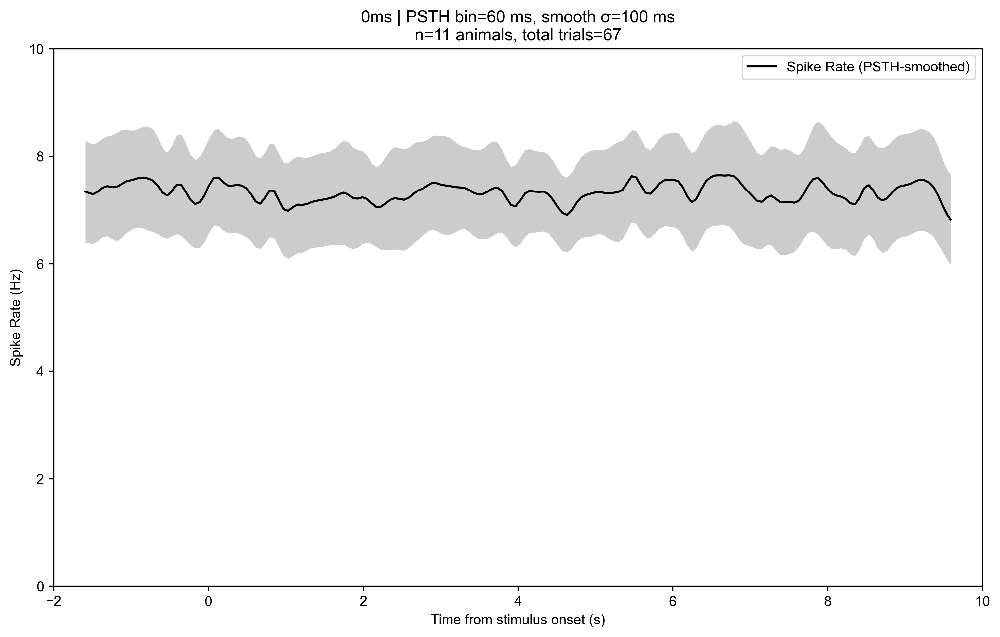


Processing 100ms with PSTH-only (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_100ms_PSTH_only.csv


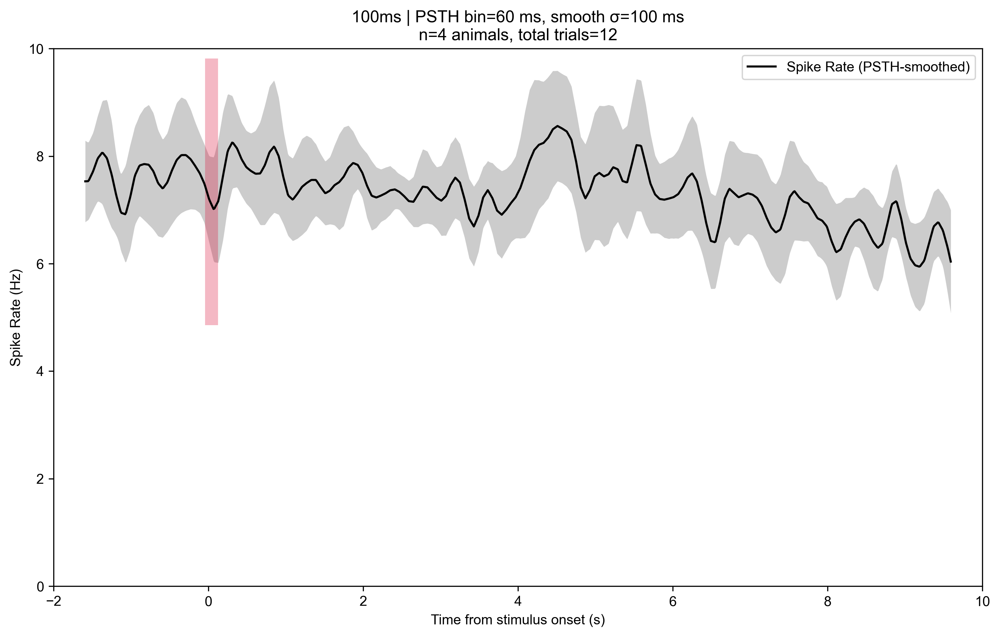


Processing 300ms with PSTH-only (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_300ms_PSTH_only.csv


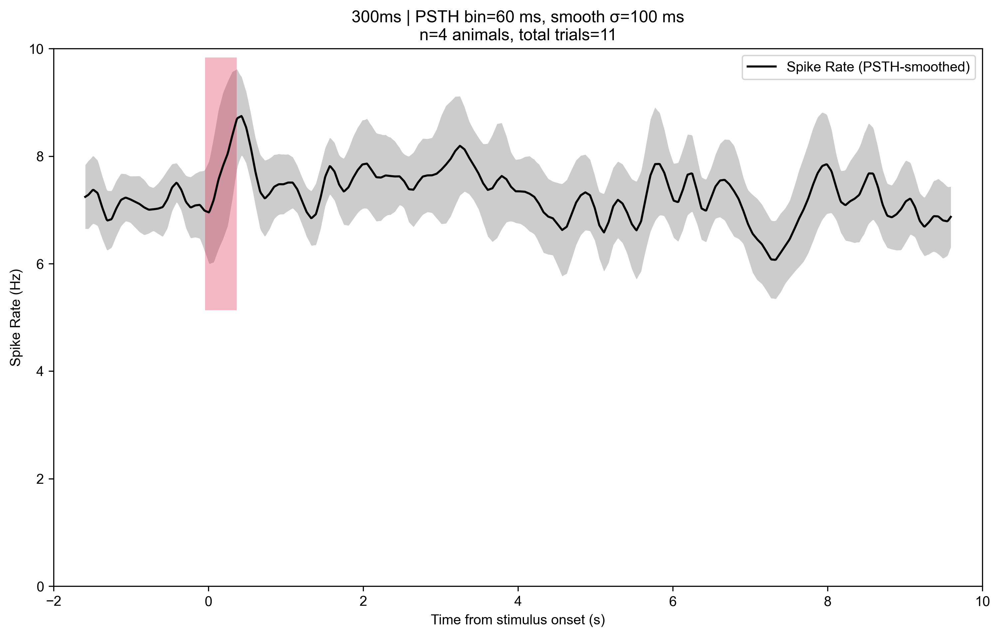


Processing 1000ms with PSTH-only (found in 4 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_1000ms_PSTH_only.csv


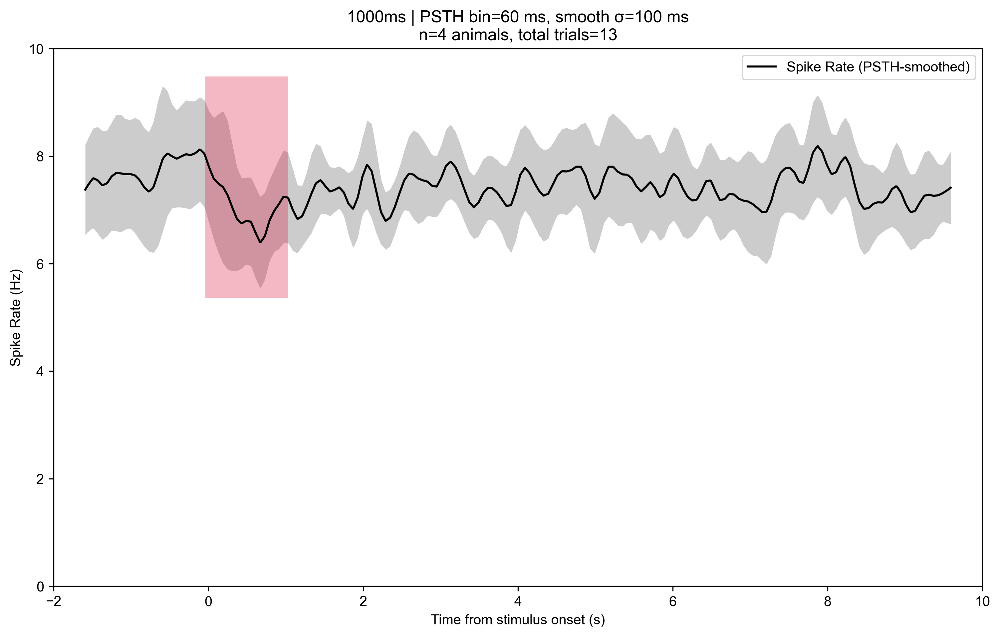


Processing 1500ms with PSTH-only (found in 1 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_1500ms_PSTH_only.csv


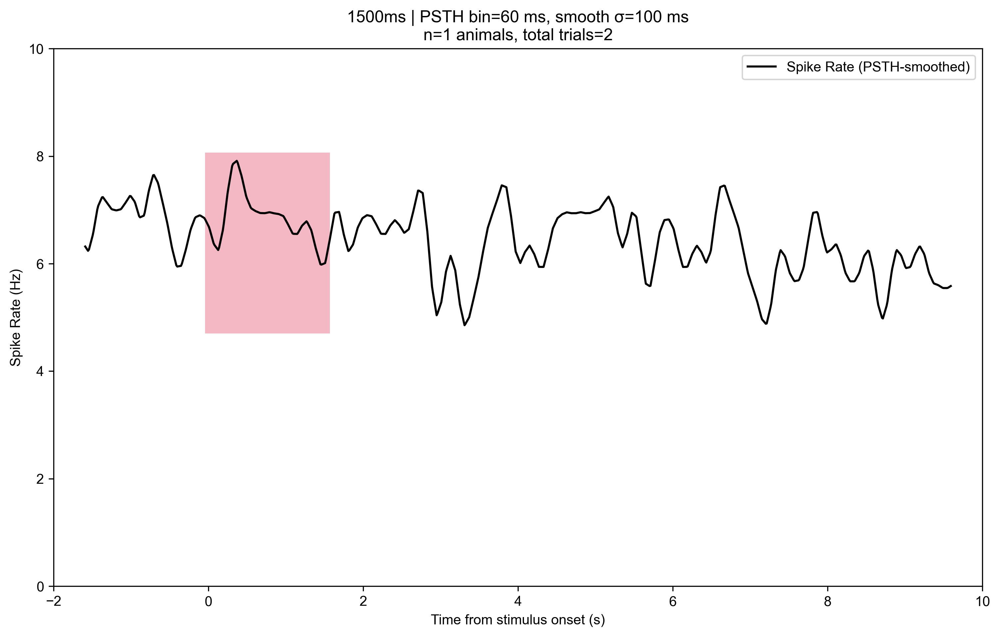


Processing 2000ms with PSTH-only (found in 1 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_2000ms_PSTH_only.csv


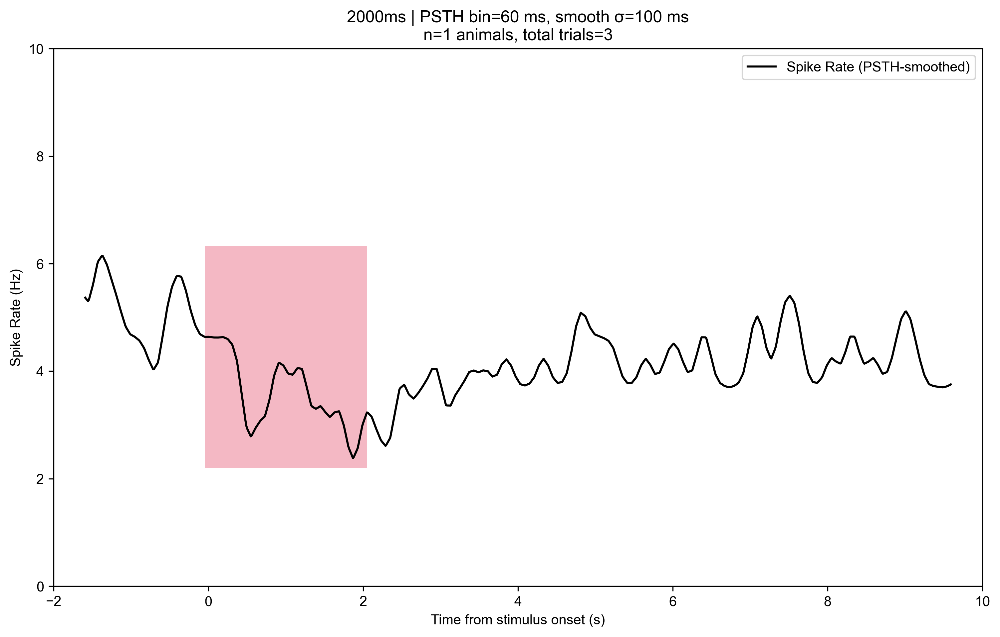


Processing 3000ms with PSTH-only (found in 11 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_3000ms_PSTH_only.csv


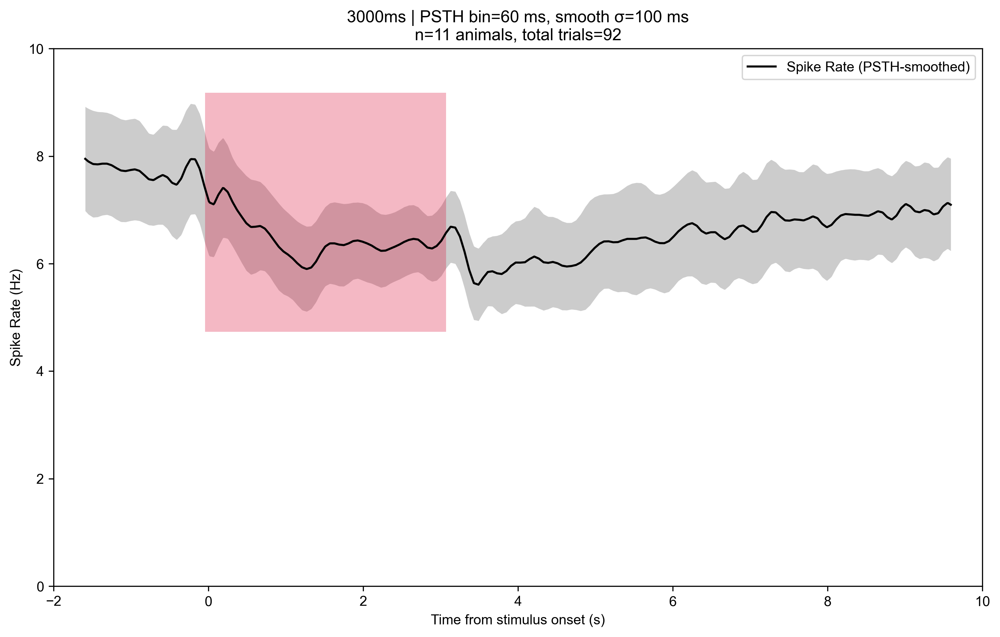


Processing 5000ms with PSTH-only (found in 3 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_5000ms_PSTH_only.csv


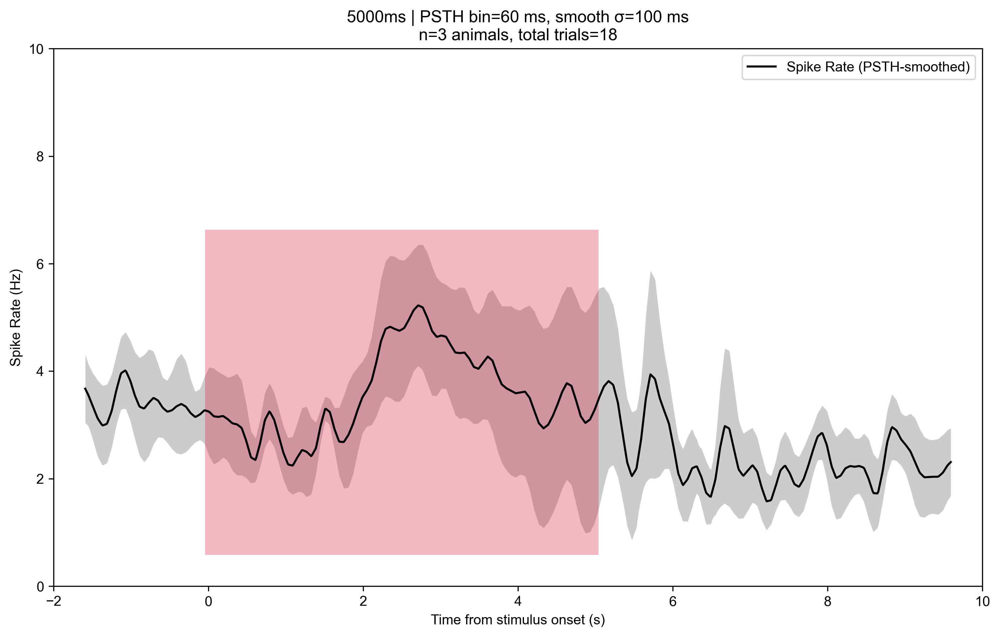


Processing 10000ms with PSTH-only (found in 6 animals)
Saved CSV to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/summary_across_animals_10000ms_PSTH_only.csv


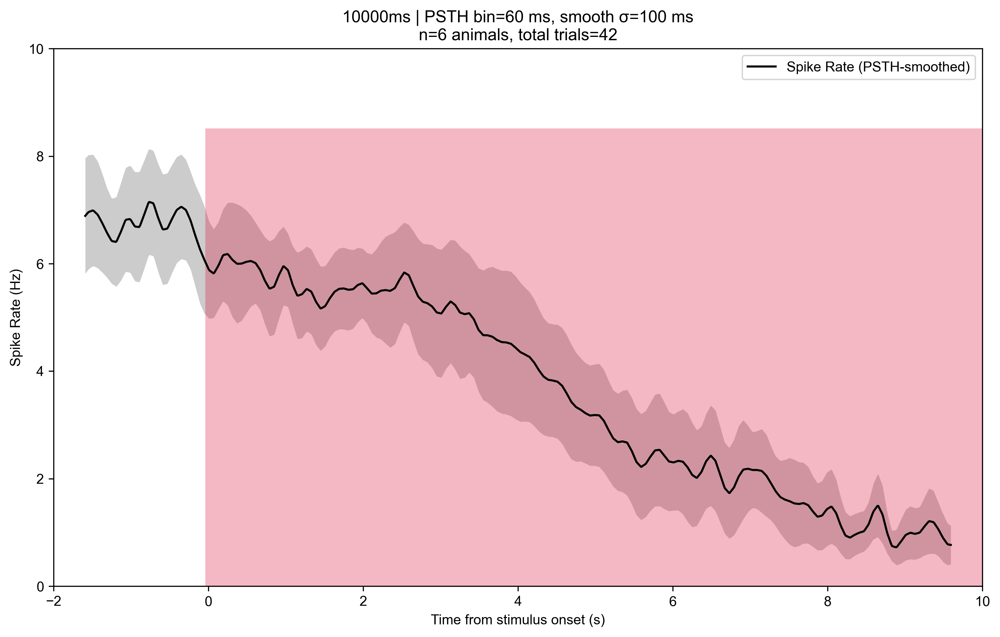

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import matplotlib as mpl
from spiracle_helper_functions import set_plot_style
set_plot_style()  # Affinity/Illustrator-safe SVG fonts (Arial, editable text)

# ---- directory (same as yours) ----
main_directory = '/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR'
main_path = Path(main_directory)

def get_stim_color(directory_path: str) -> str:
    if 'ChR' in directory_path:
        return 'crimson'
    elif 'GtACR' in directory_path:
        return 'lightgreen'
    else:
        return 'lightgray'

# ---- PSTH utilities ----
def _gaussian_kernel(sigma_s: float, dt_s: float, radius_sigmas: float = 4.0) -> np.ndarray:
    if sigma_s <= 0:
        return np.array([1.0], dtype=float)
    sigma_bins = sigma_s / dt_s
    half_width = int(np.ceil(radius_sigmas * sigma_bins))
    x = np.arange(-half_width, half_width + 1)
    k = np.exp(-0.5 * (x / sigma_bins) ** 2)
    k /= k.sum()
    return k

def compute_animal_psth(
    df: pd.DataFrame,
    time_window=(-2.0, 10.0),
    bin_size_s=0.05,
    smooth_sigma_s=0.05,
    trial_col_prefix="Spike Count Trial"
):
    """
    Per-animal PSTH from binary raster columns:
    - 1 means spike at that exact Time(s) (no edge detection)
    - Time(s) can be irregular; we treat spikes as event timestamps.
    Returns:
      centers, rate_hz, rate_smoothed_hz, opto_binned, n_trials
    """
    if 'Time (s)' not in df.columns:
        raise ValueError("Missing 'Time (s)' column")

    t0, t1 = time_window
    mask = (df['Time (s)'] >= t0) & (df['Time (s)'] <= t1)
    d = df.loc[mask].copy()
    t = d['Time (s)'].to_numpy()

    spike_cols = [c for c in d.columns if c.startswith(trial_col_prefix)]
    n_trials = len(spike_cols)
    if n_trials == 0:
        raise ValueError(f"No trial columns starting with '{trial_col_prefix}'")

    pooled_spike_times = []
    for c in spike_cols:
        spikes = d[c].to_numpy()
        spike_idx = np.where(spikes == 1)[0]
        if spike_idx.size > 0:
            pooled_spike_times.append(t[spike_idx])
    pooled_spike_times = np.concatenate(pooled_spike_times) if pooled_spike_times else np.array([], dtype=float)

    edges = np.arange(t0, t1 + bin_size_s, bin_size_s)
    centers = edges[:-1] + bin_size_s / 2.0

    counts, _ = np.histogram(pooled_spike_times, bins=edges)
    rate_hz = counts / (n_trials * bin_size_s)

    k = _gaussian_kernel(sigma_s=smooth_sigma_s, dt_s=bin_size_s)
    rate_smoothed_hz = np.convolve(rate_hz, k, mode='same')

    # Bin Opto Stimulus to centers (mean within each bin)
    if 'Opto Stimulus' in d.columns:
        stim = d['Opto Stimulus'].to_numpy()
        bin_idx = np.digitize(t, edges) - 1
        opto_binned = np.zeros_like(centers, dtype=float)
        for bi in range(len(centers)):
            sel = (bin_idx == bi)
            opto_binned[bi] = np.mean(stim[sel]) if np.any(sel) else 0.0
    else:
        opto_binned = np.zeros_like(centers, dtype=float)

    return centers, rate_hz, rate_smoothed_hz, opto_binned, n_trials

def plot_cross_animal_summary_psth_only(
    stim_files: list,
    time_window=(-2, 10),
    bin_size_s=0.06,
    smooth_sigma_s=0.06,
    save_fig=True
) -> None:
    stim_color = get_stim_color(str(main_path))

    # Common timebase for averaging/plotting
    time = np.linspace(time_window[0], time_window[1], 1000)

    per_animal_rates = []
    per_animal_stim = []
    total_trials = 0

    for file in stim_files:
        df = pd.read_csv(file)
        centers, _, rate_sm, opto_binned, n_trials = compute_animal_psth(
            df,
            time_window=time_window,
            bin_size_s=bin_size_s,
            smooth_sigma_s=smooth_sigma_s
        )
        total_trials += n_trials

        per_animal_rates.append(np.interp(time, centers, rate_sm, left=0.0, right=0.0))
        per_animal_stim.append(np.interp(time, centers, opto_binned, left=0.0, right=0.0))

    rates = np.vstack(per_animal_rates)
    stim_mat = np.vstack(per_animal_stim)

    mean_rate = rates.mean(axis=0)
    sem_rate = rates.std(axis=0, ddof=0) / np.sqrt(rates.shape[0])
    mean_stim = stim_mat.mean(axis=0)

    stim_duration = stim_files[0].stem.split('_')[1]  # e.g., "3000ms"

    trim = 4 * smooth_sigma_s
    valid = (time >= time_window[0] + trim) & (time <= time_window[1] - trim)

    fig = plt.figure(figsize=(12, 7), dpi=300)
    ax = fig.add_subplot(111)
    ax.grid(False)

    ax.plot(time[valid], mean_rate[valid],
        color='black', label='Spike Rate (PSTH-smoothed)')

    ax.fill_between(time[valid],
                    (mean_rate - sem_rate)[valid],
                    (mean_rate + sem_rate)[valid],
                    color='black', alpha=0.2, linewidth=0)

    # Stimulus shading
    y0, y1 = ax.get_ylim()
    ax.fill_between(time, y0, y1, where=mean_stim > 0,
                    color=stim_color, alpha=0.3, linewidth=0)

    ax.set_xlim(time_window)
    ax.set_ylabel('Spike Rate (Hz)')
    ax.set_xlabel('Time from stimulus onset (s)')
    ax.set_ylim(0, 10)

    ax.set_title(
        f"{stim_duration} | PSTH bin={int(bin_size_s*1000)} ms, smooth σ={int(smooth_sigma_s*1000)} ms\n"
        f"n={rates.shape[0]} animals, total trials={total_trials}"
    )
    ax.legend(loc='upper right')

    if save_fig:
        # Save SVG
        out_svg = main_path / f'summary_across_animals_{stim_duration}_PSTH_only.svg'
        plt.savefig(out_svg, format='svg', bbox_inches='tight')
        # Save CSV with PSTH summary data
        psth_df = pd.DataFrame({
            'Time (s)': time,
            'Mean Spike Rate (PSTH)': mean_rate,
            'SEM Spike Rate (PSTH)': sem_rate,
            'Opto Stimulus': mean_stim,
        })
        out_csv = main_path / f'summary_across_animals_{stim_duration}_PSTH_only.csv'
        psth_df.to_csv(out_csv, index=False)
        print(f"Saved CSV to: {out_csv}")

    plt.show()

# ---- Discover fly folders + summary files (same logic as yours) ----
fly_folders = [f for f in main_path.iterdir() if f.is_dir() and 'EMG' in f.name and 'Y' in f.name]
print(f"Found {len(fly_folders)} fly folders")
for f in fly_folders:
    print(f)

summary_by_duration = {}
for fly_folder in fly_folders:
    summary_files = list(fly_folder.glob('summary_*ms.csv'))
    for file_path in summary_files:
        stim_duration = file_path.stem.split('_')[1]  # "3000ms", etc.
        summary_by_duration.setdefault(stim_duration, []).append(file_path)

stim_durations = sorted(summary_by_duration.keys(), key=lambda x: int(x.rstrip('ms')))

# ---- Run PSTH plots for each stim duration ----
for stim_duration in stim_durations:
    files = summary_by_duration[stim_duration]
    print(f"\nProcessing {stim_duration} with PSTH-only (found in {len(files)} animals)")
    plot_cross_animal_summary_psth_only(
        files,
        time_window=(-2, 10),
        bin_size_s=0.06,       # try 0.025 or 0.05
        smooth_sigma_s=0.1,   # try 0.03–0.05
        save_fig=True
    )


# Block 5: Plot spike rate from a single CSV file using helper functions

This block loads a selected CSV file, optionally recomputes spike rate, and saves a spike-rate plot as an SVG.

**中文：** 本 Block 载入选定的单个 CSV，（可选）用辅助函数 `calculate_spike_rate` 从 `Spike Count` 重新计算发放率，绘制发放率随时间变化并叠加刺激阴影，保存为 SVG。用于快速查看单个文件。

In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np  # only needed if you recompute spike rate

%run "/Users/camellyc/Library/Mobile Documents/com~apple~CloudDocs/学习/Lab/Tuthill Lab/Codes/Flight_Arena_Analysis/spiracle_helper_functions.py"

def plot_spike_rate_from_csv(csv_file, output_dir=None,
                             sampling_rate=20000,
                             recompute_spike_rate=False,
                             target_spike_rate=7.0,
                             stim_color='lightgreen'):
    """
    Plot spike rate from a (possibly spike-filtered) CSV file and save as an SVG.
    
    Assumes CSV has at least:
        - 'Time (s)'
        - 'Spike Count'
        - optionally 'Spike Rate'
        - optionally 'Opto Stimulus'
    
    Args:
        csv_file (str or Path): input CSV file.
        output_dir (str or Path or None): directory to save SVG.
            If None, uses csv_file's parent directory.
        sampling_rate (int): sampling rate in Hz (for recomputing spike rate).
        recompute_spike_rate (bool): if True, recompute spike rate from Spike Count
            using your calculate_spike_rate helper.
        target_spike_rate (float): passed to calculate_spike_rate if recomputing.
        stim_color (str): color for shading opto stimulus.
    
    Returns:
        str: path to saved SVG file.
    """
    # ---- Load data ----
    df = pd.read_csv(csv_file)

    if 'Time (s)' not in df.columns:
        raise ValueError("CSV must contain a 'Time (s)' column.")
    if 'Spike Count' not in df.columns and 'Spike Rate' not in df.columns:
        raise ValueError("CSV must contain either 'Spike Count' or 'Spike Rate'.")

    time = df['Time (s)']

    # ---- Ensure Spike Rate exists ----
    if recompute_spike_rate or 'Spike Rate' not in df.columns:
        if 'Spike Count' not in df.columns:
            raise ValueError("Cannot recompute spike rate: 'Spike Count' column is missing.")
        spike_count = df['Spike Count'].values
        # uses your existing helper
        spike_rate = calculate_spike_rate(spike_count,
                                          sampling_rate=sampling_rate,
                                          target_spike_rate=target_spike_rate)
        df['Spike Rate'] = spike_rate
    else:
        spike_rate = df['Spike Rate'].values

    # ---- Prepare output path ----
    if output_dir is None:
        output_dir = os.path.dirname(os.path.abspath(csv_file))
    os.makedirs(output_dir, exist_ok=True)

    base_name = os.path.splitext(os.path.basename(csv_file))[0]
    out_svg = os.path.join(output_dir, f"{base_name}_spikerate.svg")

    # ---- Make the plot ----
    fig, ax = plt.subplots(figsize=(12, 4))

    # Spike rate trace
    ax.plot(time, spike_rate, color='mediumseagreen', linewidth=1.2, label='Spike Rate (Hz)')
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Spike Rate (Hz)", color='mediumseagreen')
    ax.tick_params(axis='y', labelcolor='mediumseagreen')

    # Set a reasonable y-limit if you like (similar to your other plots)
    if np.any(np.isfinite(spike_rate)):
        ymin = 0
        ymax = max(15, np.nanmax(spike_rate) * 1.1)
        ax.set_ylim(ymin, ymax)

    # Optional stimulus shading
    if 'Opto Stimulus' in df.columns:
        stim = df['Opto Stimulus'].values
        ymin, ymax = ax.get_ylim()
        ax.fill_between(time, ymin, ymax,
                        where=stim > 0,
                        color=stim_color,
                        alpha=0.3,
                        label='Opto Stimulus')

    ax.set_title(base_name)
    ax.legend(loc='upper right')
    plt.tight_layout()

    # ---- Save SVG ----
    plt.savefig(out_svg, format='svg', bbox_inches='tight')
    plt.close(fig)

    print(f"Saved spike rate plot to: {out_svg}")
    return out_svg

csv_file = '/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/260114_SpMN4_ChR_EMG/process_Fly1_EMG_Y/output_csv_spikefiltered/0ms/SpMN4_ChR_EMG_IS76603_ChR_5d_F_Fly1_Trial1_0ms_thorax_2026_0114_142343_bout1_stim0ms.csv'

# simplest: use existing Spike Rate column and save SVG next to CSV
plot_spike_rate_from_csv(csv_file)

# or, if you want to recompute Spike Rate from Spike Count:
plot_spike_rate_from_csv(
    csv_file,
    output_dir='/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/260114_SpMN4_ChR_EMG/process_Fly1_EMG_Y',
    recompute_spike_rate=True,   # recompute from Spike Count
    sampling_rate=20000,
    target_spike_rate=5.0
)


Saved spike rate plot to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/260114_SpMN4_ChR_EMG/process_Fly1_EMG_Y/output_csv_spikefiltered/0ms/SpMN4_ChR_EMG_IS76603_ChR_5d_F_Fly1_Trial1_0ms_thorax_2026_0114_142343_bout1_stim0ms_spikerate.svg
Saved spike rate plot to: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/260114_SpMN4_ChR_EMG/process_Fly1_EMG_Y/SpMN4_ChR_EMG_IS76603_ChR_5d_F_Fly1_Trial1_0ms_thorax_2026_0114_142343_bout1_stim0ms_spikerate.svg


'/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/260114_SpMN4_ChR_EMG/process_Fly1_EMG_Y/SpMN4_ChR_EMG_IS76603_ChR_5d_F_Fly1_Trial1_0ms_thorax_2026_0114_142343_bout1_stim0ms_spikerate.svg'

# Block 6: ISI Analysis — Epoch Histograms and Peristimulus Mean ISI

This block computes Inter-Spike Interval (ISI) metrics from the binary spike raster stored in `summary_{stim}ms.csv` files.  
Three analyses are produced per stimulus duration:
1. **Epoch ISI histograms** — ISI distribution during Pre / During / Post stimulus epochs
2. **Pooled ISI histogram** — overall ISI distribution across the full recording window
3. **Peristimulus mean ISI** — sliding-window mean ISI aligned to stimulus onset (cross-animal mean ± SEM)

Three CSVs are saved per stimulus duration: `isi_psth_*.csv`, `isi_epoch_histograms_*.csv`, `isi_histogram_*.csv`.

**中文：** 本 Block 从 `summary_{刺激}ms.csv` 中的二值锋电位栅格计算锋电位间隔（ISI）指标。每个刺激时长产出三类分析：(1) **分时期 ISI 直方图**——Pre／During／Post 时期内的 ISI 分布；(2) **合并 ISI 直方图**——整个记录窗内的总体 ISI 分布；(3) **刺激周围平均 ISI**——对齐刺激起始的滑动窗平均 ISI（跨个体均值 ± SEM）。每个刺激时长保存三个 CSV：`isi_psth_*.csv`、`isi_epoch_histograms_*.csv`、`isi_histogram_*.csv`。

> 本 Block 包含 4 个代码单元（Cell A–D）：A 计算并保存 ISI；B 绘制直方图与刺激周围 ISI；C 比较不同平滑方法；D 绘制 ECDF 并做 Mann–Whitney 检验。

**Cell A — ISI computation.** Discovers the fly folders and `summary_*ms.csv` files, extracts spike timestamps from the binary raster columns, and for each stimulus duration computes the peristimulus mean ISI (sliding window), the per-epoch ISI arrays/histograms (Pre/During/Post), and a pooled ISI histogram. Saves three CSVs per duration (writing via `/tmp` to avoid Google-Drive write hangs) and stores everything in the `isi_results` dict for the plotting cells.

**Cell A —— ISI 计算。** 发现各果蝇文件夹与 `summary_*ms.csv`，从二值栅格列提取锋电位时间戳，对每个刺激时长计算刺激周围平均 ISI（滑动窗）、各时期 ISI 数组/直方图（Pre/During/Post）以及合并 ISI 直方图。每个时长保存三个 CSV（先写入 `/tmp` 再拷回，以避免 Google Drive 写入卡顿），并把所有结果存入 `isi_results` 字典供后续绘图单元使用。

In [42]:
# Block 6 — Cell A: ISI Computation
# Extracts spike times from binary raster, computes per-epoch and peristimulus ISI,
# saves three CSVs per stimulus duration.

import numpy as np
import pandas as pd
import shutil
import time as _time
from pathlib import Path
from scipy import stats
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['savefig.dpi'] = 300

# ── Parameters ────────────────────────────────────────────────────────────────
# Update main_directory to match Block 4 above
main_directory = '/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR'
main_path = Path(main_directory)

# Write outputs to /tmp first to avoid Google Drive hanging on writes
local_out = Path('/tmp/isi_output')
local_out.mkdir(exist_ok=True)

ISI_TIME_WINDOW  = (-2.0, 10.0)   # seconds, same as PSTH
ISI_WINDOW_S     = 0.2            # 200 ms sliding window for peristimulus ISI
ISI_STEP_S       = 0.05           # 50 ms step (matches PSTH bin size)
ISI_HIST_MAX_MS  = 500            # upper bound of ISI histogram (ms)
ISI_HIST_BIN_MS  = 1              # bin width (ms)

# Epoch windows (seconds, aligned to stimulus onset)
EPOCHS = {
    "Pre":    (-2.0, 0.0),
    "During": ( 0.0, 3.0),   # skipped automatically for 0 ms condition
    "Post":   ( 3.0, 5.0),
}

# ── Helper functions ───────────────────────────────────────────────────────────
def extract_spike_times(df, time_window, trial_col_prefix="Spike Count Trial"):
    """
    Return sparse spike-time arrays (one per trial) within time_window.
    Works on numpy arrays directly — avoids slow df.loc copy on large DataFrames.
    """
    t0, t1 = time_window
    t_all  = df['Time (s)'].to_numpy()
    mask   = (t_all >= t0) & (t_all <= t1)
    t_win  = t_all[mask]
    cols   = [c for c in df.columns if c.startswith(trial_col_prefix)]
    per_trial = []
    for c in cols:
        spikes_win = df[c].to_numpy()[mask]
        idx = np.where(spikes_win == 1)[0]
        per_trial.append(t_win[idx] if idx.size > 0 else np.array([], dtype=float))
    return per_trial


def compute_isis(per_trial_times):
    """Concatenate ISIs (ms) from a list of per-trial spike-time arrays."""
    parts = []
    for st in per_trial_times:
        if len(st) >= 2:
            parts.append(np.diff(st) * 1000.0)
    return np.concatenate(parts) if parts else np.array([], dtype=float)


def compute_peristimulus_isi(per_trial_times, time_window, window_s, step_s):
    """
    Sliding-window mean ISI aligned to stimulus onset.
    For each window: pool consecutive ISIs per trial, take mean across trials.
    Returns (centers, mean_isi_ms). NaN where no pairs of spikes exist.
    """
    t0, t1   = time_window
    starts   = np.arange(t0, t1 - window_s + 1e-9, step_s)
    centers  = starts + window_s / 2.0
    mean_isi = np.full(len(centers), np.nan)
    for i, s in enumerate(starts):
        e = s + window_s
        window_isis = []
        for st in per_trial_times:
            in_win = st[(st >= s) & (st < e)]
            if len(in_win) >= 2:
                window_isis.append(np.diff(in_win) * 1000.0)
        if window_isis:
            mean_isi[i] = np.mean(np.concatenate(window_isis))
    return centers, mean_isi


def save_csv_via_tmp(df, filename):
    """Write CSV to /tmp, then copy to Drive — prevents Drive-write hang."""
    local_p = local_out / filename
    df.to_csv(local_p, index=False)
    shutil.copy2(local_p, main_path / filename)


# Deterministic PSTH center grid (parameter-driven, identical across files)
_t0, _t1 = ISI_TIME_WINDOW
ISI_COMMON_CENTERS = np.arange(_t0, _t1 - ISI_WINDOW_S + 1e-9, ISI_STEP_S) + ISI_WINDOW_S / 2.0

# ── Discover fly folders (same logic as Block 4) ──────────────────────────────
fly_folders = [f for f in main_path.iterdir()
               if f.is_dir() and 'EMG' in f.name and 'Y' in f.name]
print(f"Found {len(fly_folders)} fly folders")
for f in fly_folders:
    print(f"  {f.name}")

summary_by_duration = {}
for fly_folder in fly_folders:
    for fp in fly_folder.glob('summary_*ms.csv'):
        stim_dur = fp.stem.split('_')[1]
        summary_by_duration.setdefault(stim_dur, []).append(fp)

stim_durations = sorted(summary_by_duration.keys(), key=lambda x: int(x.rstrip('ms')))
print(f"Stimulus conditions: {stim_durations}")

# ── Main computation ───────────────────────────────────────────────────────────
hist_edges   = np.arange(0, ISI_HIST_MAX_MS + ISI_HIST_BIN_MS, ISI_HIST_BIN_MS)
hist_centers = hist_edges[:-1] + ISI_HIST_BIN_MS / 2.0

isi_results = {}   # stored in notebook scope for Cell B

for stim_duration in stim_durations:
    files   = summary_by_duration[stim_duration]
    stim_ms = int(stim_duration.rstrip('ms'))
    print(f"\n── {stim_duration}  ({len(files)} files) ──────────────────────────")
    t_cond = _time.time()

    active_epochs = dict(EPOCHS)

    per_animal_psth_isi = []
    epoch_isis_all      = {ep: [] for ep in active_epochs}
    all_pooled_isis     = []

    for file in files:
        # ── Load only the columns needed for ISI (key speed fix) ──────────
        # Skips Spike Rate, WBF, Amplitude, etc. — reduces read time ~60%.
        print(f"  Reading {file.name} ...", end=' ', flush=True)
        t0_r = _time.time()
        df = pd.read_csv(
            file,
            usecols=lambda c: c == 'Time (s)' or c.startswith('Spike Count Trial')
        )
        print(f"{len(df):,} rows × {len(df.columns)} cols  [{_time.time()-t0_r:.1f}s]")

        # ── Extract sparse spike timestamps (numpy path, no DataFrame copy) ─
        per_trial = extract_spike_times(df, ISI_TIME_WINDOW)
        print(f"    {len(per_trial)} trials, "
              f"{sum(len(s) for s in per_trial)} spikes in window")

        # Peristimulus ISI (sliding window)
        _, anim_mean_isi = compute_peristimulus_isi(
            per_trial, ISI_TIME_WINDOW, ISI_WINDOW_S, ISI_STEP_S
        )
        per_animal_psth_isi.append(anim_mean_isi)

        # Epoch ISIs
        for ep, (ep_t0, ep_t1) in active_epochs.items():
            ep_times = [st[(st >= ep_t0) & (st < ep_t1)] for st in per_trial]
            epoch_isis_all[ep].append(compute_isis(ep_times))

        # Full-window pooled ISIs
        all_pooled_isis.append(compute_isis(per_trial))

    # Cross-animal average for peristimulus ISI
    isi_mat      = np.vstack(per_animal_psth_isi)
    mean_isi_avg = np.nanmean(isi_mat, axis=0)
    sem_isi_avg  = stats.sem(isi_mat, axis=0, nan_policy='omit')

    # Epoch histograms (pooled across all animals)
    epoch_hists = {}
    for ep, isis_list in epoch_isis_all.items():
        all_ep    = np.concatenate(isis_list) if isis_list else np.array([], dtype=float)
        counts, _ = np.histogram(all_ep, bins=hist_edges)
        total     = counts.sum()
        probs     = counts / total if total > 0 else counts.astype(float)
        epoch_hists[ep] = {"counts": counts, "probs": probs, "n_spikes": int(total)}

    # Raw ISI arrays per epoch — kept for KDE smoothing in Cell B
    epoch_raw_isis = {
        ep: np.concatenate(isis_list) if isis_list else np.array([], dtype=float)
        for ep, isis_list in epoch_isis_all.items()
    }

    # Pooled histogram across full time window
    all_isis_full  = np.concatenate(all_pooled_isis) if all_pooled_isis else np.array([], dtype=float)
    pool_counts, _ = np.histogram(all_isis_full, bins=hist_edges)
    pool_total     = pool_counts.sum()
    pool_probs     = pool_counts / pool_total if pool_total > 0 else pool_counts.astype(float)

    # ── Save CSVs (/tmp → Drive copy) ─────────────────────────────────────
    print("  Saving CSVs ...", end=' ', flush=True)
    t0_s = _time.time()
    save_csv_via_tmp(pd.DataFrame({
        'Time (s)':      ISI_COMMON_CENTERS,
        'Mean ISI (ms)': mean_isi_avg,
        'SEM ISI (ms)':  sem_isi_avg,
    }), f'isi_psth_{stim_duration}.csv')

    ep_df = pd.DataFrame({'ISI Bin Center (ms)': hist_centers})
    for ep, h in epoch_hists.items():
        ep_df[f'{ep} Count']       = h['counts']
        ep_df[f'{ep} Probability'] = h['probs']
    save_csv_via_tmp(ep_df, f'isi_epoch_histograms_{stim_duration}.csv')

    save_csv_via_tmp(pd.DataFrame({
        'ISI Bin Center (ms)': hist_centers,
        'Count':               pool_counts,
        'Probability':         pool_probs,
    }), f'isi_histogram_{stim_duration}.csv')
    print(f"done [{_time.time()-t0_s:.1f}s]")

    isi_results[stim_duration] = {
        'centers':        ISI_COMMON_CENTERS,
        'mean_isi':       mean_isi_avg,
        'sem_isi':        sem_isi_avg,
        'epoch_hists':    epoch_hists,
        'epoch_raw_isis': epoch_raw_isis,
        'pooled_hist':    {'counts': pool_counts, 'probs': pool_probs},
        'hist_centers':   hist_centers,
        'stim_ms':        stim_ms,
        'n_animals':      len(files),
    }
    print(f"  ✓ {stim_duration} complete  [{_time.time()-t_cond:.1f}s total]")

print("\nISI computation complete.")


Found 13 fly folders
  260516_SpMN4_A1ACR_EMG_Fly5_Y
  260516_SpMN4_A1ACR_EMG_Fly1_Y
  251219_SpMN4_A1ACR_EMG_Fly3_Y
  260516_SpMN4_A1ACR_EMG_Fly6_Y
  260516_SpMN4_A1ACR_EMG_Fly2_Y
  251219_SpMN4_A1ACR_EMG_Fly4_Y
  260516_SpMN4_A1ACR_EMG_Fly7_Y
  260516_SpMN4_A1ACR_EMG_Fly3_Y
  251219_SpMN4_A1ACR_EMG_Fly1_Y
  251219_SpMN4_A1ACR_EMG_Fly5_Y
  260516_SpMN4_A1ACR_EMG_Fly4_Y
  251219_SpMN4_A1ACR_EMG_Fly2_Y
  251219_SpMN4_A1ACR_EMG_Fly6_Y
Stimulus conditions: ['0ms', '3000ms', '10000ms']

── 0ms  (13 files) ──────────────────────────
  Reading summary_0ms.csv ... 777,128 rows × 3 cols  [0.2s]
    2 trials, 188 spikes in window
  Reading summary_0ms.csv ... 1,066,556 rows × 7 cols  [0.4s]
    6 trials, 562 spikes in window
  Reading summary_0ms.csv ... 994,172 rows × 4 cols  [0.3s]
    3 trials, 256 spikes in window
  Reading summary_0ms.csv ... 994,172 rows × 4 cols  [0.3s]
    3 trials, 207 spikes in window
  Reading summary_0ms.csv ... 822,699 rows × 4 cols  [0.3s]
    3 trials, 266 spikes

/var/folders/24/4641y0j978d462l0ntzxn_l40000gn/T/ipykernel_23246/875026111.py:165: RuntimeWarning: Mean of empty slice
  mean_isi_avg = np.nanmean(isi_mat, axis=0)
/var/folders/24/4641y0j978d462l0ntzxn_l40000gn/T/ipykernel_23246/875026111.py:166: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_isi_avg  = stats.sem(isi_mat, axis=0, nan_policy='omit')


**Cell B — ISI plotting.** Uses the `isi_results` dict from Cell A to draw, per stimulus duration, a 3-panel figure: overlaid epoch ISI histograms (Pre/During/Post), the pooled ISI histogram, and the cross-animal peristimulus mean ISI ± SEM. Saves one SVG per duration.

**Cell B —— ISI 绘图。** 使用 Cell A 生成的 `isi_results`，为每个刺激时长绘制三联图：叠加的分时期 ISI 直方图（Pre/During/Post）、合并 ISI 直方图，以及跨个体的刺激周围平均 ISI ± SEM。每个时长保存一张 SVG。

Saved: isi_analysis_0ms.svg


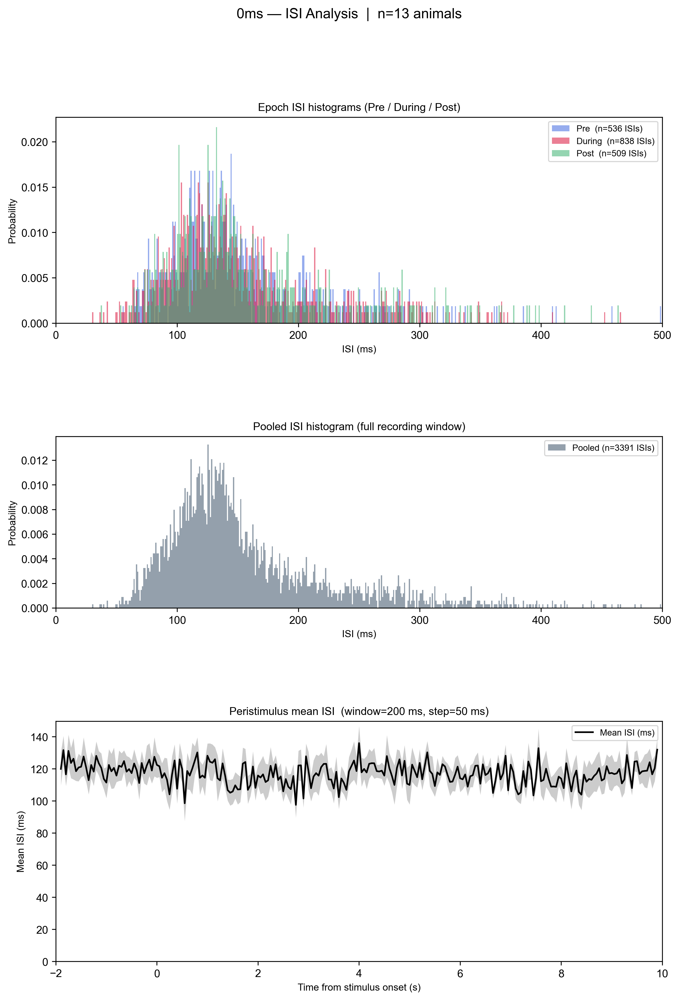

Saved: isi_analysis_3000ms.svg


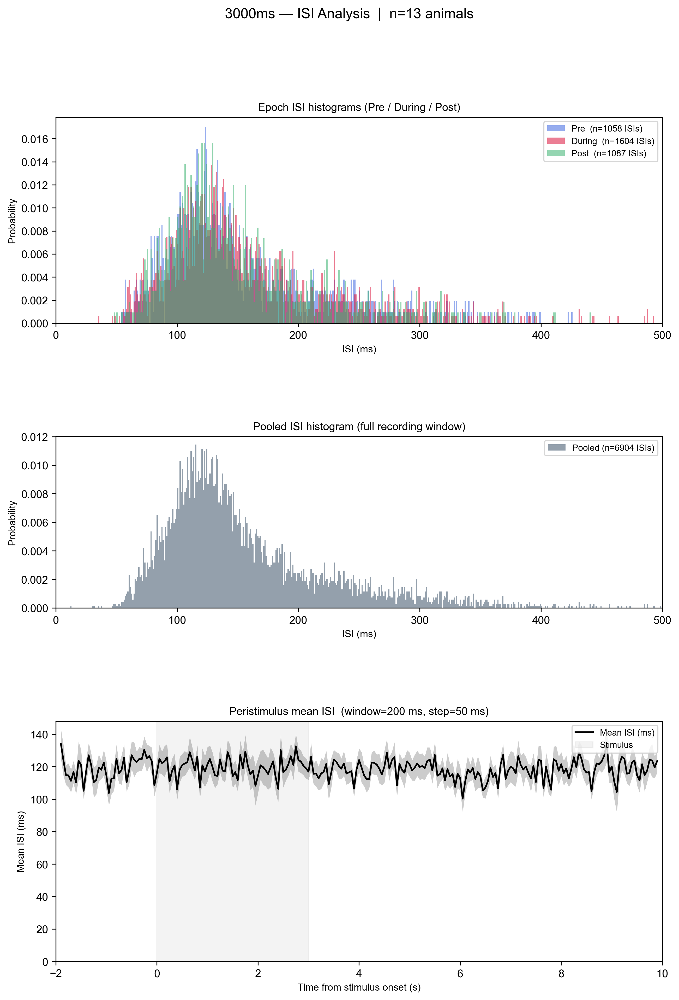

Saved: isi_analysis_10000ms.svg


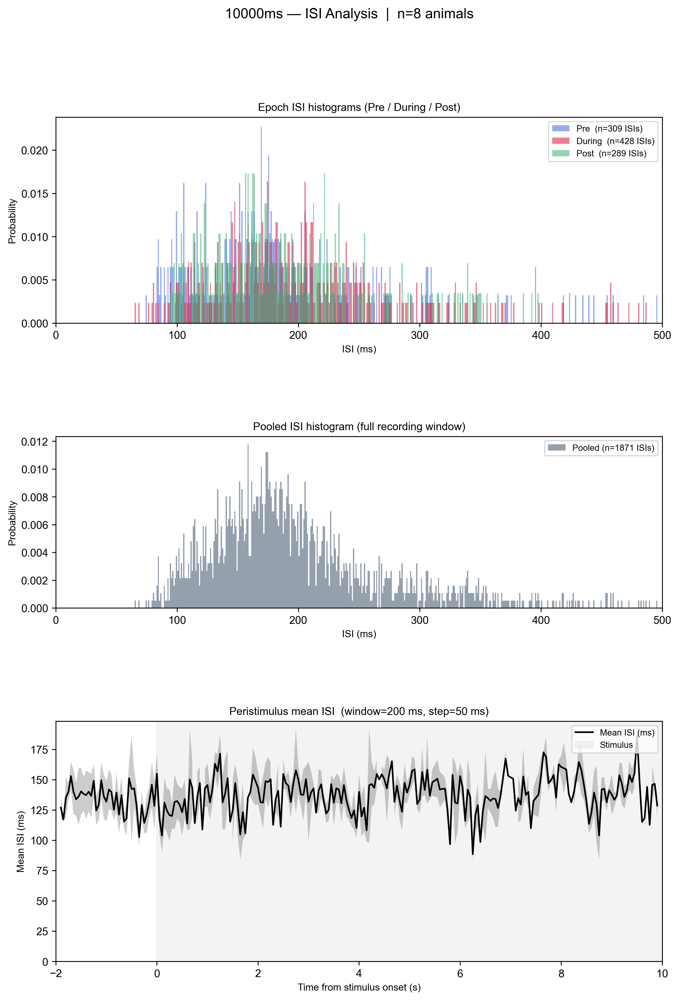

In [43]:
# Block 6 — Cell B: ISI Plotting
# Uses isi_results dict produced by Cell A.
# Produces one figure per stimulus duration — 3 panels:
#   Row 0 — Epoch ISI histograms overlaid (Pre / During / Post, Post drawn on top)
#   Row 1 — Pooled ISI histogram (full time window)
#   Row 2 — Peristimulus mean ISI ± SEM (cross-animal)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import shutil
from pathlib import Path
from matplotlib.gridspec import GridSpec

from spiracle_helper_functions import set_plot_style
set_plot_style()  # Affinity/Illustrator-safe SVG fonts (Arial, editable text)

# /tmp staging dir — SVG writes to Drive hang; copy after
local_out = Path('/tmp/isi_output')
local_out.mkdir(exist_ok=True)

EPOCH_DRAW_ORDER = ["Pre", "During", "Post"]
EPOCH_COLORS     = {"Pre": "royalblue", "During": "crimson", "Post": "mediumseagreen"}
POOLED_COLOR     = "slategray"
PSTH_ISI_COLOR   = "black"


def _stim_color(directory_path: str) -> str:
    if 'ChR' in directory_path:
        return 'crimson'
    elif 'GtACR' in directory_path:
        return 'lightgreen'
    return 'lightgray'


def save_svg_via_tmp(fig, filename):
    """Save SVG to /tmp then copy to Drive — prevents Drive-write hang."""
    local_p = local_out / filename
    fig.savefig(local_p, format='svg', bbox_inches='tight')
    shutil.copy2(local_p, main_path / filename)


stim_color = _stim_color(str(main_path))

for stim_duration, res in isi_results.items():
    stim_ms     = res['stim_ms']
    n_animals   = res['n_animals']
    epoch_hists = res['epoch_hists']
    hist_ctrs   = res['hist_centers']
    pooled      = res['pooled_hist']
    centers     = res['centers']
    mean_isi    = res['mean_isi']
    sem_isi     = res['sem_isi']

    # Epochs available for this condition (During absent for 0 ms)
    epochs_to_plot = [ep for ep in EPOCH_DRAW_ORDER if ep in epoch_hists]

    fig = plt.figure(figsize=(10, 14), dpi=300)
    gs  = GridSpec(3, 1, figure=fig,
                   height_ratios=[1.2, 1, 1.4],
                   hspace=0.55)

    # Row 0: Overlaid epoch ISI histograms
    ax_ep = fig.add_subplot(gs[0])
    for ep in epochs_to_plot:
        h = epoch_hists[ep]
        ax_ep.bar(hist_ctrs, h['probs'], width=ISI_HIST_BIN_MS,
                  color=EPOCH_COLORS[ep], alpha=0.55,
                  label=f'{ep}  (n={h["n_spikes"]} ISIs)')
    ax_ep.set_xlabel('ISI (ms)', fontsize=9)
    ax_ep.set_ylabel('Probability', fontsize=9)
    ax_ep.set_title('Epoch ISI histograms (Pre / During / Post)', fontsize=10)
    ax_ep.set_xlim(0, ISI_HIST_MAX_MS)
    ax_ep.set_ylim(bottom=0)
    ax_ep.legend(loc='upper right', fontsize=8)
    ax_ep.grid(False)

    # Row 1: Pooled ISI histogram
    ax_pool = fig.add_subplot(gs[1])
    n_pool  = int(pooled['counts'].sum())
    ax_pool.bar(hist_ctrs, pooled['probs'], width=ISI_HIST_BIN_MS,
                color=POOLED_COLOR, alpha=0.75,
                label=f'Pooled (n={n_pool} ISIs)')
    ax_pool.set_xlabel('ISI (ms)', fontsize=9)
    ax_pool.set_ylabel('Probability', fontsize=9)
    ax_pool.set_title('Pooled ISI histogram (full recording window)', fontsize=10)
    ax_pool.set_xlim(0, ISI_HIST_MAX_MS)
    ax_pool.set_ylim(bottom=0)
    ax_pool.legend(loc='upper right', fontsize=8)
    ax_pool.grid(False)

    # Row 2: Peristimulus mean ISI
    ax_psth = fig.add_subplot(gs[2])
    valid   = ~np.isnan(mean_isi)
    ax_psth.plot(centers[valid], mean_isi[valid],
                 color=PSTH_ISI_COLOR, linewidth=1.5, label='Mean ISI (ms)')
    ax_psth.fill_between(centers[valid],
                         (mean_isi - sem_isi)[valid],
                         (mean_isi + sem_isi)[valid],
                         color=PSTH_ISI_COLOR, alpha=0.2, linewidth=0)
    if stim_ms > 0:
        ax_psth.axvspan(0, stim_ms / 1000.0, color=stim_color,
                        alpha=0.25, zorder=0, label='Stimulus')
    ax_psth.set_xlabel('Time from stimulus onset (s)', fontsize=9)
    ax_psth.set_ylabel('Mean ISI (ms)', fontsize=9)
    ax_psth.set_title(f'Peristimulus mean ISI  '
                      f'(window={int(ISI_WINDOW_S*1000)} ms, '
                      f'step={int(ISI_STEP_S*1000)} ms)', fontsize=10)
    ax_psth.set_xlim(ISI_TIME_WINDOW)
    ax_psth.set_ylim(bottom=0)
    ax_psth.legend(loc='upper right', fontsize=8)
    ax_psth.grid(False)

    fig.suptitle(f"{stim_duration} — ISI Analysis  |  n={n_animals} animals",
                 fontsize=13, y=0.98)

    fname = f'isi_analysis_{stim_duration}.svg'
    save_svg_via_tmp(fig, fname)
    print(f"Saved: {fname}")
    plt.show()


**Cell C — smoothing-method comparison.** For each stimulus duration and epoch, overlays the raw ISI histogram with three smoothers (fixed-bandwidth linear KDE, log-transform KDE, and Savitzky–Golay) so you can pick the best smoothing for the ISI distributions. Saves one comparison SVG per duration.

**Cell C —— 平滑方法比较。** 对每个刺激时长与时期，将原始 ISI 直方图与三种平滑方法（固定带宽线性 KDE、对数变换 KDE、Savitzky–Golay）叠加，以便为 ISI 分布选择最合适的平滑方式。每个时长保存一张比较 SVG。

Saved: isi_smoothing_compare_0ms.svg


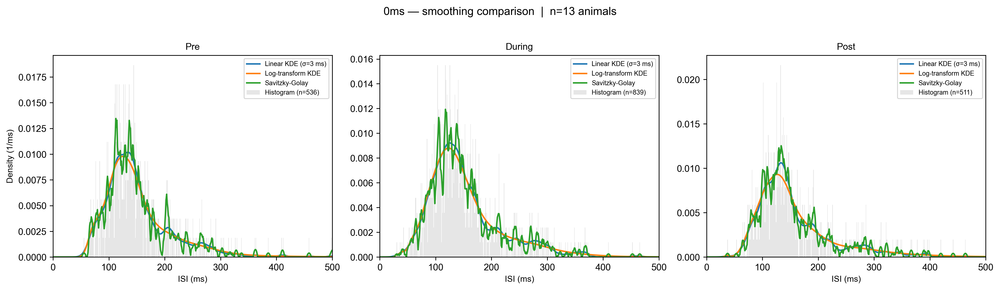

Saved: isi_smoothing_compare_3000ms.svg


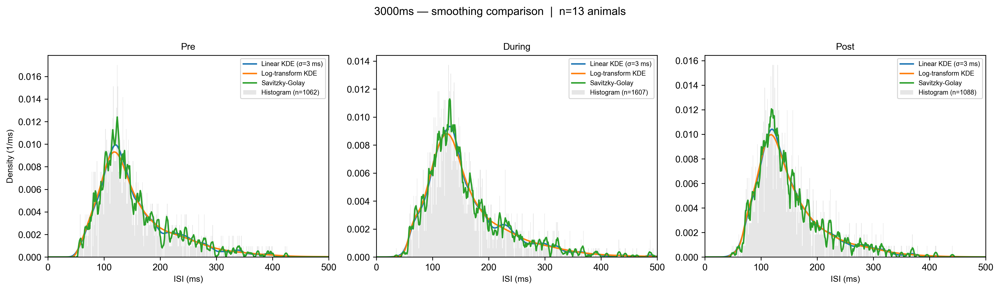

Saved: isi_smoothing_compare_10000ms.svg


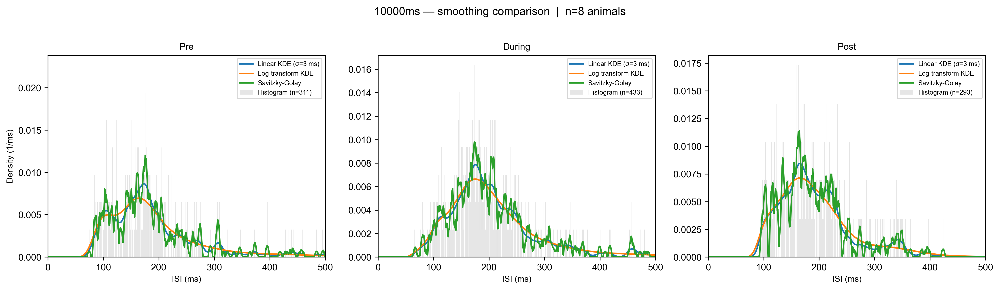

In [44]:
# Block 6 — Cell C: Smoothing method comparison
# For each stim duration, plots Pre/During/Post epochs side-by-side, each with
# the raw histogram (faint) + three overlaid smoothers so we can pick a winner.

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import savgol_filter
from spiracle_helper_functions import set_plot_style
set_plot_style()  # Affinity/Illustrator-safe SVG fonts

LINEAR_KDE_SIGMA_MS = 3.0    # kernel std-dev (ms) for linear-space KDE
SAVGOL_WINDOW       = 11     # bins, must be odd
SAVGOL_POLYORDER    = 3
KDE_GRID_N          = 1000

x_grid     = np.linspace(0, ISI_HIST_MAX_MS, KDE_GRID_N)
log_x_grid = np.log(np.clip(x_grid, 1e-3, None))   # avoid log(0)


def kde_linear_fixed_bw(isis):
    """Linear-space Gaussian KDE with fixed kernel sigma (in ms), zero-reflected."""
    if isis.size < 2 or np.ptp(isis) == 0:
        return None
    std = isis.std(ddof=1)
    if std == 0:
        return None
    bw = LINEAR_KDE_SIGMA_MS / std    # scipy's bw is in units of data std
    samples = np.concatenate([isis, -isis])
    kde = gaussian_kde(samples, bw_method=bw)
    return kde(x_grid) * 2.0          # reflection doubles density on x >= 0


def kde_log(isis):
    """KDE on log(ISI), transformed back to linear density (Jacobian = 1/x)."""
    pos = isis[isis > 0]
    if pos.size < 2 or np.ptp(np.log(pos)) == 0:
        return None
    kde = gaussian_kde(np.log(pos))   # Scott's rule on log scale
    dens_log = kde(log_x_grid)
    return dens_log / np.clip(x_grid, 1e-3, None)


def savgol_on_hist(probs):
    """Savitzky-Golay smoothed histogram, converted to density (1/ms)."""
    if probs.sum() == 0 or probs.size < SAVGOL_WINDOW:
        return None
    density = probs / ISI_HIST_BIN_MS
    return savgol_filter(density, SAVGOL_WINDOW, SAVGOL_POLYORDER)


SMOOTHER_STYLES = {
    'Linear KDE (σ=3 ms)': dict(color='tab:blue',   linewidth=1.6),
    'Log-transform KDE':   dict(color='tab:orange', linewidth=1.6),
    'Savitzky-Golay':      dict(color='tab:green',  linewidth=1.6),
}


for stim_duration, res in isi_results.items():
    epoch_raw   = res['epoch_raw_isis']
    epoch_hists = res['epoch_hists']
    hist_ctrs   = res['hist_centers']
    n_animals   = res['n_animals']
    epochs_here = [ep for ep in EPOCH_DRAW_ORDER if ep in epoch_raw]

    n_panels = len(epochs_here)
    fig, axes = plt.subplots(1, n_panels, figsize=(5 * n_panels, 4.2),
                              dpi=300, sharex=True)
    if n_panels == 1:
        axes = [axes]

    for ax, ep in zip(axes, epochs_here):
        isis  = epoch_raw[ep]
        probs = epoch_hists[ep]['probs']

        # Faint histogram backdrop (converted to density: 1/ms)
        ax.bar(hist_ctrs, probs / ISI_HIST_BIN_MS,
               width=ISI_HIST_BIN_MS, color='lightgray',
               alpha=0.55, edgecolor='none', zorder=0,
               label=f'Histogram (n={isis.size})')

        curves = {
            'Linear KDE (σ=3 ms)': kde_linear_fixed_bw(isis),
            'Log-transform KDE':   kde_log(isis),
            'Savitzky-Golay':      savgol_on_hist(probs),
        }
        x_savgol = hist_ctrs
        for name, dens in curves.items():
            if dens is None:
                continue
            x_plot = x_savgol if name == 'Savitzky-Golay' else x_grid
            ax.plot(x_plot, dens, label=name, **SMOOTHER_STYLES[name])

        ax.set_title(f'{ep}', fontsize=10)
        ax.set_xlabel('ISI (ms)', fontsize=9)
        ax.set_xlim(0, ISI_HIST_MAX_MS)
        ax.set_ylim(bottom=0)
        ax.grid(False)
        ax.legend(loc='upper right', fontsize=7)

    axes[0].set_ylabel('Density (1/ms)', fontsize=9)
    fig.suptitle(f'{stim_duration} — smoothing comparison  |  n={n_animals} animals',
                 fontsize=12, y=1.02)
    fig.tight_layout()

    fname = f'isi_smoothing_compare_{stim_duration}.svg'
    save_svg_via_tmp(fig, fname)
    print(f"Saved: {fname}")
    plt.show()


**Cell D — ECDF + Mann–Whitney epoch comparison.** Pools ISIs per epoch across animals/trials, plots their ECDFs, and runs pairwise Mann–Whitney U tests (Pre/During/Post). Because pooled n is huge, it reports effect sizes (rank-biserial r, median shift, KS D, Wasserstein distance) alongside p, and saves the stats to `isi_mwu_*.csv`.

**Cell D —— ECDF + Mann–Whitney 时期比较。** 将各时期的 ISI 跨个体/试次合并，绘制其 ECDF，并做两两 Mann–Whitney U 检验（Pre/During/Post）。由于合并样本量极大，除 p 值外还报告效应量（rank-biserial r、中位数偏移、KS 的 D、Wasserstein 距离），并将统计结果保存到 `isi_mwu_*.csv`。

Saved: isi_ecdf_0ms.svg  +  isi_mwu_0ms.csv


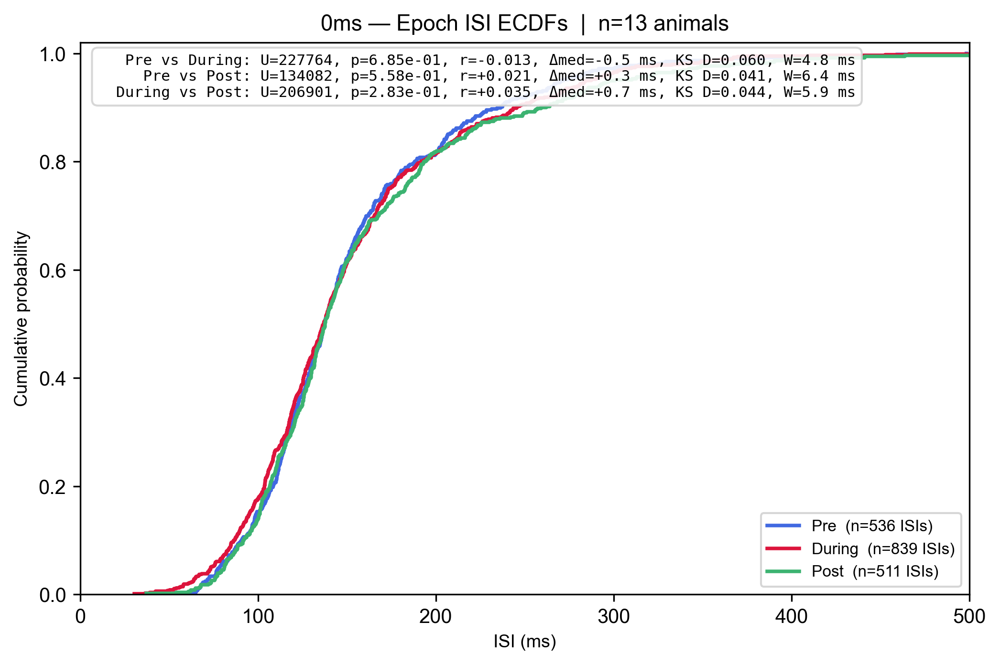

Saved: isi_ecdf_3000ms.svg  +  isi_mwu_3000ms.csv


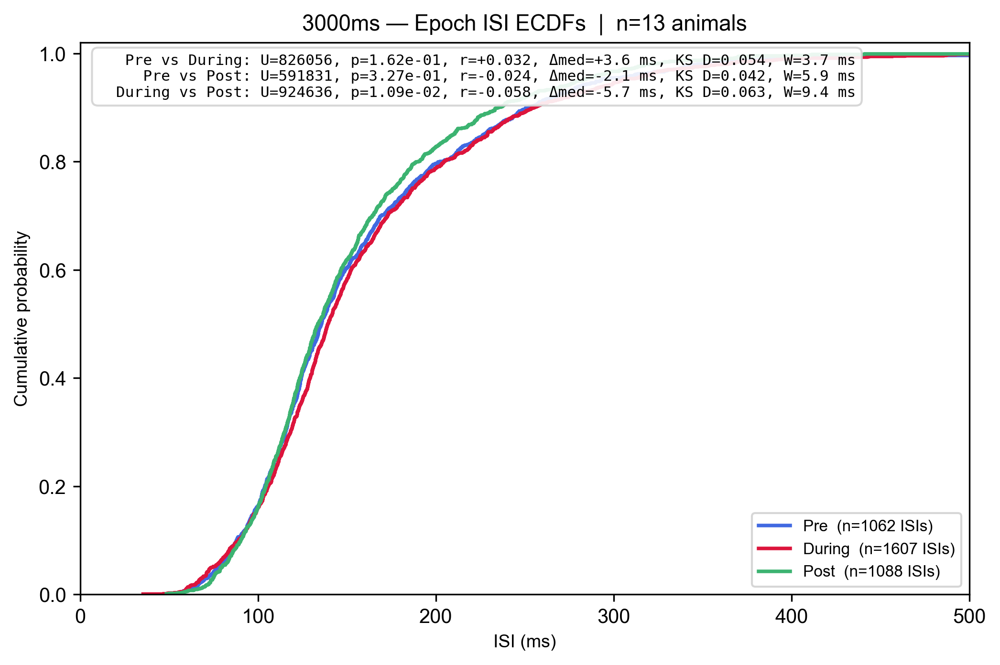

Saved: isi_ecdf_10000ms.svg  +  isi_mwu_10000ms.csv


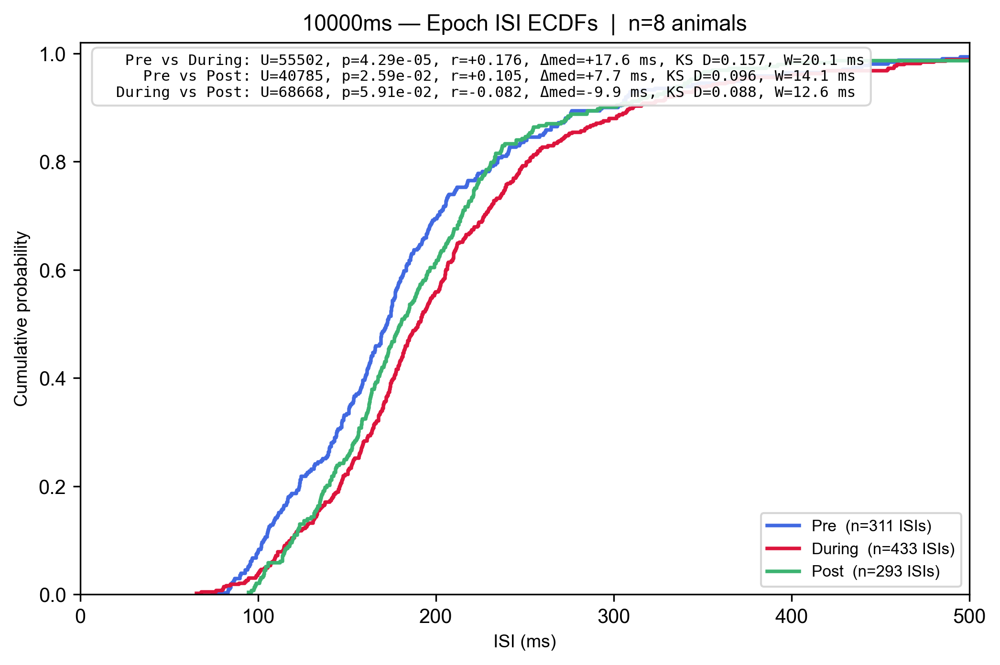

In [45]:
# Block 6 — Cell D: ECDF + Mann–Whitney U epoch comparison
# Pools ISIs across animals/trials per epoch, plots ECDFs, runs MWU pairwise.
# Reports effect sizes alongside p (pooled n is huge → p alone is misleading).

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from spiracle_helper_functions import set_plot_style
set_plot_style()  # Affinity/Illustrator-safe SVG fonts

PAIRS = [("Pre", "During"), ("Pre", "Post"), ("During", "Post")]


def _ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, xs.size + 1) / xs.size
    return xs, ys


def _compare(a, b):
    """Return dict of test statistics for distribution a vs b."""
    u, p   = stats.mannwhitneyu(a, b, alternative='two-sided')
    r_rb   = 1.0 - 2.0 * u / (a.size * b.size)
    ks     = stats.ks_2samp(a, b)
    w_dist = stats.wasserstein_distance(a, b)
    return {
        'n_a':              a.size,
        'n_b':              b.size,
        'U':                u,
        'p':                p,
        'rank_biserial_r':  r_rb,
        'median_shift_ms':  float(np.median(b) - np.median(a)),
        'ks_D':             ks.statistic,
        'wasserstein_ms':   w_dist,
    }


for stim_duration, res in isi_results.items():
    epoch_raw   = res['epoch_raw_isis']
    n_animals   = res['n_animals']
    epochs_here = [ep for ep in EPOCH_DRAW_ORDER if ep in epoch_raw and epoch_raw[ep].size > 0]

    # ── Pairwise stats ───────────────────────────────────────────────────
    rows = []
    for ep_a, ep_b in PAIRS:
        if ep_a not in epoch_raw or ep_b not in epoch_raw:
            continue
        a = epoch_raw[ep_a]; b = epoch_raw[ep_b]
        if a.size < 2 or b.size < 2:
            continue
        row = {'comparison': f'{ep_a} vs {ep_b}'} | _compare(a, b)
        rows.append(row)
    stats_df = pd.DataFrame(rows)
    save_csv_via_tmp(stats_df, f'isi_mwu_{stim_duration}.csv')

    # ── Figure: ECDF overlay + annotated stats ───────────────────────────
    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
    for ep in epochs_here:
        xs, ys = _ecdf(epoch_raw[ep])
        ax.step(xs, ys, where='post',
                color=EPOCH_COLORS[ep], linewidth=1.8,
                label=f'{ep}  (n={epoch_raw[ep].size} ISIs)')
    ax.set_xlim(0, ISI_HIST_MAX_MS)
    ax.set_ylim(0, 1.02)
    ax.set_xlabel('ISI (ms)', fontsize=9)
    ax.set_ylabel('Cumulative probability', fontsize=9)
    ax.set_title(f'{stim_duration} — Epoch ISI ECDFs  |  n={n_animals} animals',
                 fontsize=11)
    ax.legend(loc='lower right', fontsize=8)
    ax.grid(False)

    # Annotation box with test stats
    lines = []
    for r in rows:
        lines.append(
            f"{r['comparison']:>16s}: "
            f"U={r['U']:.0f}, p={r['p']:.2e}, "
            f"r={r['rank_biserial_r']:+.3f}, "
            f"Δmed={r['median_shift_ms']:+.1f} ms, "
            f"KS D={r['ks_D']:.3f}, W={r['wasserstein_ms']:.1f} ms"
        )
    if lines:
        ax.text(0.02, 0.98, '\n'.join(lines),
                transform=ax.transAxes, fontsize=7.5,
                family='monospace', va='top', ha='left',
                bbox=dict(boxstyle='round,pad=0.4',
                          facecolor='white', edgecolor='lightgray', alpha=0.9))

    fname = f'isi_ecdf_{stim_duration}.svg'
    save_svg_via_tmp(fig, fname)
    print(f"Saved: {fname}  +  isi_mwu_{stim_duration}.csv")
    plt.show()


# Block 7: Per-experiment epoch spike-rate analysis (Pre / During / Post)

For each stimulus duration, this block computes a **count-based** mean spike rate per animal in the three epochs (`Pre = [-2, 0)`, `During = [0, 3)`, `Post = [3, 5)`), using raw `Spike Count Trial *` columns rather than the boxcar-smoothed `Spike Rate` column (which leaks spikes across epoch boundaries through its kernel).

Per stimulus duration it saves:
- `epoch_rates_{stim}.csv` — per-animal Pre/During/Post rate (Hz) and median ISI (ms).
- `epoch_stats_{stim}.csv` — paired Wilcoxon **Pre vs During** and **Pre vs Post** on rate and median ISI.
- `epoch_rates_{stim}.svg` — box-and-swarm of per-animal rates with paired connecting lines and stat annotations.

All stim durations (including `0ms`) use the same Pre (-2-0 s), During (0-3 s), and Post (3-5 s) epochs. Requires `summary_by_duration` and `stim_durations` from Block 6 Cell A to be in scope (re-run that cell if needed).

**中文：** 对每个刺激时长，本 Block 计算每个个体在三个时期（`Pre = [-2, 0)`、`During = [0, 3)`、`Post = [3, 5)`）的**基于计数**的平均发放率，直接用原始 `Spike Count Trial *` 列，而非箱型平滑后的 `Spike Rate` 列（后者的核会把锋电位跨时期边界“泄漏”）。每个刺激时长保存：`epoch_rates_{刺激}.csv`（每个体的 Pre/During/Post 发放率与中位 ISI）、`epoch_stats_{刺激}.csv`（对发放率与中位 ISI 的配对 Wilcoxon：Pre vs During、Pre vs Post）、`epoch_rates_{刺激}.svg`（每个体发放率的箱线+散点图，带配对连线与统计标注）。所有刺激时长（含 `0ms`）都使用相同的时期划分。需要 Block 6 Cell A 中的 `summary_by_duration` 与 `stim_durations` 仍在内存中（如有必要请重跑该单元）。


── 0ms (13 animals) ──
  Saved per-animal CSV: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR/epoch_rates_0ms.csv
         metric          pair  n   median_a   median_b     mean_a     mean_b    W  p_wilcoxon         t  p_ttest
      Rate (Hz) Pre vs During 13   6.166667   6.777778   6.421795   6.542735 39.0    0.684814 -0.407071 0.691123
      Rate (Hz)   Pre vs Post 13   6.166667   7.500000   6.421795   6.170513 24.0    0.423138  0.946645 0.362493
Median ISI (ms) Pre vs During 13 158.850000 143.850000 160.392308 166.248077 30.0    0.305420 -0.823543 0.426264
Median ISI (ms)   Pre vs Post 13 158.850000 132.275000 160.392308 168.109615 33.0    0.414307 -1.021747 0.327058


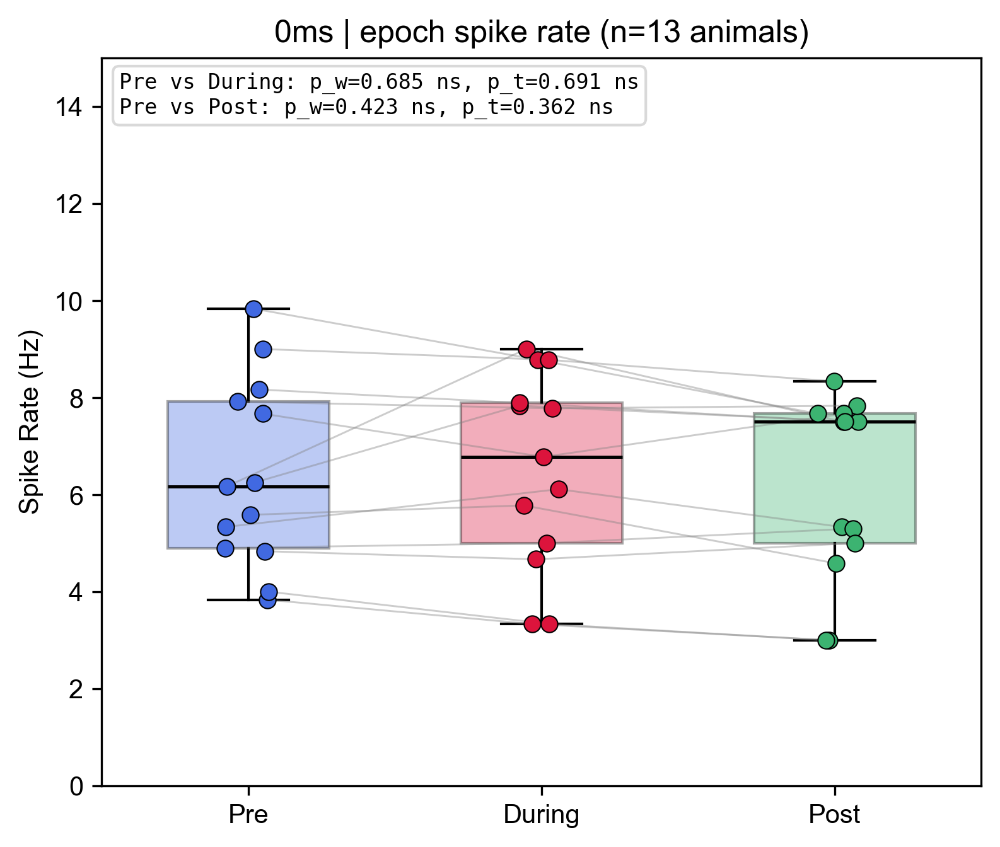


── 3000ms (13 animals) ──
  Saved per-animal CSV: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR/epoch_rates_3000ms.csv
         metric          pair  n  median_a   median_b     mean_a     mean_b    W  p_wilcoxon         t  p_ttest
      Rate (Hz) Pre vs During 13      5.75   5.969697   6.372919   6.167510 29.0    0.273438  0.871072 0.400806
      Rate (Hz)   Pre vs Post 13      5.75   6.454545   6.372919   6.388353 40.0    0.735352 -0.064157 0.949902
Median ISI (ms) Pre vs During 13    171.85 146.550000 169.038462 168.448077 26.0    0.190918  0.067664 0.947167
Median ISI (ms)   Pre vs Post 13    171.85 131.000000 169.038462 157.651923 36.0    0.541748  1.347750 0.202633


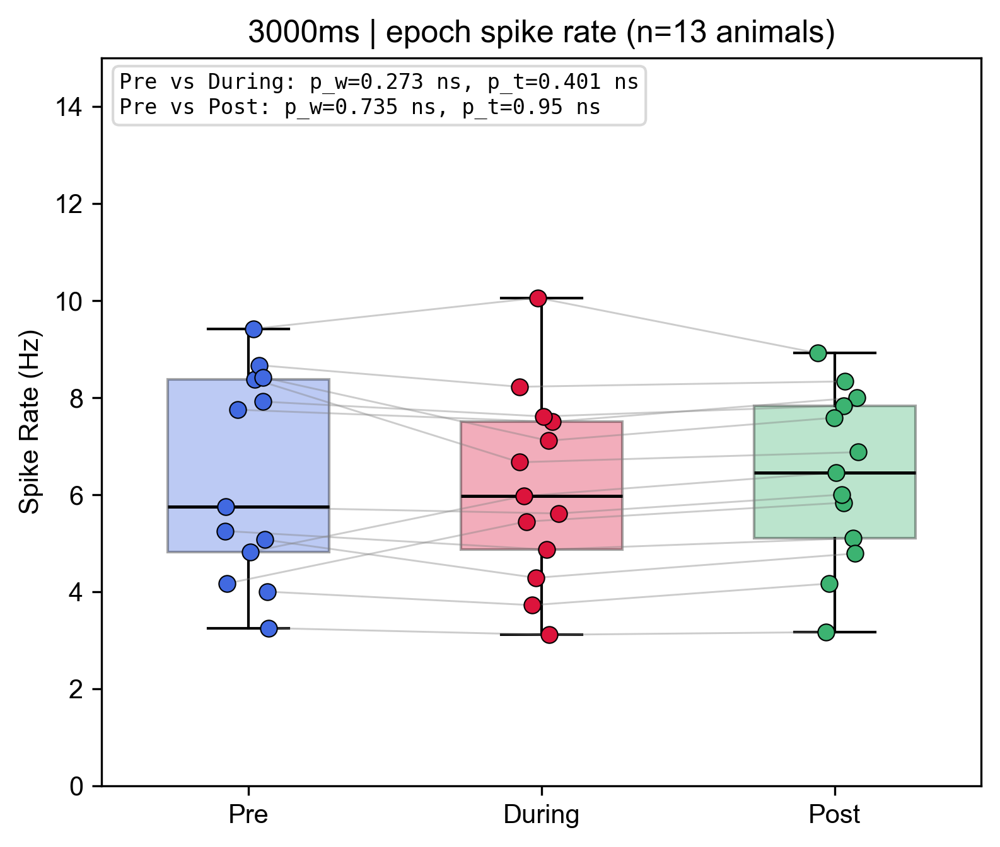


── 10000ms (8 animals) ──
  Saved per-animal CSV: /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/8_SpMN4_A1ACR/epoch_rates_10000ms.csv
         metric          pair  n   median_a   median_b    mean_a     mean_b    W  p_wilcoxon         t  p_ttest
      Rate (Hz) Pre vs During  8   5.333333   5.055556   5.65625   5.062500  6.0    0.109375  2.066076 0.077665
      Rate (Hz)   Pre vs Post  8   5.333333   5.541667   5.65625   5.229167  6.5    0.204084  1.494123 0.178788
Median ISI (ms) Pre vs During  8 178.725000 191.425000 187.69375 202.253125  7.0    0.148438 -1.956434 0.091298
Median ISI (ms)   Pre vs Post  8 178.725000 180.787500 187.69375 196.546875 10.0    0.312500 -1.397395 0.204990


/Users/camellyc/.pyenv/versions/3.13.0/lib/python3.13/site-packages/scipy/stats/_wilcoxon.py:199: UserWarning: Sample size too small for normal approximation.
  temp = _wilcoxon_iv(x, y, zero_method, correction, alternative, method, axis)


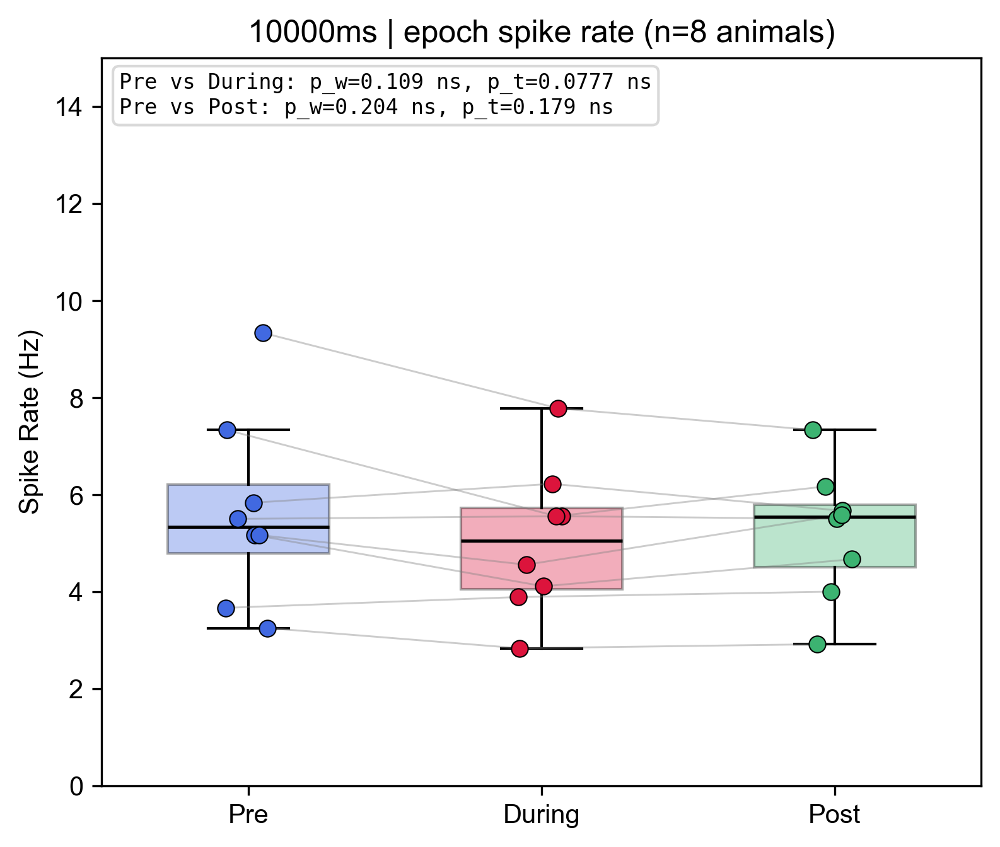


Per-experiment epoch analysis complete.


In [46]:
# Block 7 — Cell A: Per-experiment epoch spike rate (Pre / During / Post)
# Count-based rate = N_spikes_in_window / window_duration_s, averaged across trials per animal.
# Half-open windows avoid double-counting at boundaries.
# Paired Wilcoxon AND paired t-test (per animal) for Pre vs During and Pre vs Post,
# on spike rate (Hz) and median ISI (ms). Both p-values reported.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shutil
from pathlib import Path
from scipy import stats
import matplotlib as mpl

# Affinity/Illustrator-safe SVG fonts (Arial, editable text)
from spiracle_helper_functions import set_plot_style
set_plot_style()

EPOCHS = {"Pre": (-2.0, 0.0), "During": (0.0, 3.0), "Post": (3.0, 5.0)}
EPOCH_COLORS = {"Pre": "royalblue", "During": "crimson", "Post": "mediumseagreen"}

local_out = Path('/tmp/epoch_rate_output')
local_out.mkdir(exist_ok=True)


def _stim_color(directory_path: str) -> str:
    if 'ChR' in directory_path:
        return 'crimson'
    if 'GtACR' in directory_path:
        return 'lightgreen'
    return 'lightgray'


def epoch_rate_and_median_isi(df, t0, t1, trial_col_prefix="Spike Count Trial"):
    """
    Per animal, within half-open [t0, t1):
      - mean spike rate (Hz) averaged across trials
      - median ISI (ms) over all within-window ISIs pooled across trials
      - n_trials available
    """
    t = df['Time (s)'].to_numpy()
    mask = (t >= t0) & (t < t1)
    t_win = t[mask]
    cols = [c for c in df.columns if c.startswith(trial_col_prefix)]
    if not cols or t_win.size == 0:
        return np.nan, np.nan, 0
    duration = t1 - t0
    per_trial_rates = []
    per_trial_isis = []
    for c in cols:
        s = df[c].to_numpy()[mask]
        spike_times = t_win[s == 1]
        per_trial_rates.append(spike_times.size / duration)
        if spike_times.size >= 2:
            per_trial_isis.append(np.diff(spike_times) * 1000.0)
    mean_rate = float(np.mean(per_trial_rates))
    if per_trial_isis:
        all_isis = np.concatenate(per_trial_isis)
        median_isi = float(np.median(all_isis))
    else:
        median_isi = np.nan
    return mean_rate, median_isi, len(cols)


per_experiment_results = {}

for stim_duration in stim_durations:
    files = summary_by_duration[stim_duration]
    print(f"\n── {stim_duration} ({len(files)} animals) ──")

    active_epochs = dict(EPOCHS)
    epochs_here = list(active_epochs.keys())

    rows = []
    for file in files:
        animal_id = file.parent.name
        df = pd.read_csv(
            file,
            usecols=lambda c: c == 'Time (s)' or c.startswith('Spike Count Trial'),
        )
        row = {'Animal': animal_id}
        for ep, (t0, t1) in active_epochs.items():
            rate, med_isi, n_trials = epoch_rate_and_median_isi(df, t0, t1)
            row[f'{ep} Rate (Hz)'] = rate
            row[f'{ep} Median ISI (ms)'] = med_isi
            row[f'{ep} n_trials'] = n_trials
        rows.append(row)

    df_per_animal = pd.DataFrame(rows)
    csv_local = local_out / f'epoch_rates_{stim_duration}.csv'
    df_per_animal.to_csv(csv_local, index=False)
    shutil.copy2(csv_local, main_path / f'epoch_rates_{stim_duration}.csv')
    print(f"  Saved per-animal CSV: {main_path / f'epoch_rates_{stim_duration}.csv'}")

    # ── Paired Wilcoxon + paired t-test (per animal) on rate and median ISI ──
    stat_rows = []
    for metric_label, col_template in [
        ('Rate (Hz)',       '{} Rate (Hz)'),
        ('Median ISI (ms)', '{} Median ISI (ms)'),
    ]:
        for a_lab, b_lab in [('Pre', 'During'), ('Pre', 'Post')]:
            if a_lab not in epochs_here or b_lab not in epochs_here:
                continue
            a = df_per_animal[col_template.format(a_lab)].to_numpy()
            b = df_per_animal[col_template.format(b_lab)].to_numpy()
            valid = np.isfinite(a) & np.isfinite(b)
            a_v, b_v = a[valid], b[valid]
            if a_v.size < 2 or np.all(a_v == b_v):
                W, p_w = np.nan, np.nan
                t_stat, p_t = np.nan, np.nan
            else:
                res_w = stats.wilcoxon(a_v, b_v)
                W, p_w = float(res_w.statistic), float(res_w.pvalue)
                res_t = stats.ttest_rel(a_v, b_v)
                t_stat, p_t = float(res_t.statistic), float(res_t.pvalue)
            stat_rows.append({
                'metric':      metric_label,
                'pair':        f'{a_lab} vs {b_lab}',
                'n':           int(a_v.size),
                'median_a':    float(np.median(a_v)) if a_v.size else np.nan,
                'median_b':    float(np.median(b_v)) if b_v.size else np.nan,
                'mean_a':      float(np.mean(a_v))   if a_v.size else np.nan,
                'mean_b':      float(np.mean(b_v))   if b_v.size else np.nan,
                'W':           W,
                'p_wilcoxon':  p_w,
                't':           t_stat,
                'p_ttest':     p_t,
            })
    stat_df = pd.DataFrame(stat_rows)
    stat_local = local_out / f'epoch_stats_{stim_duration}.csv'
    stat_df.to_csv(stat_local, index=False)
    shutil.copy2(stat_local, main_path / f'epoch_stats_{stim_duration}.csv')
    if not stat_df.empty:
        print(stat_df.to_string(index=False))

    # ── Box + swarm of per-animal rates, with paired connecting lines ───────
    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    data = [df_per_animal[f'{ep} Rate (Hz)'].dropna().to_numpy() for ep in epochs_here]
    positions = np.arange(len(epochs_here))
    bp = ax.boxplot(
        data, positions=positions, widths=0.55, showfliers=False,
        patch_artist=True, medianprops=dict(color='black', linewidth=1.2),
    )
    for patch, ep in zip(bp['boxes'], epochs_here):
        patch.set_facecolor(EPOCH_COLORS[ep])
        patch.set_alpha(0.35)

    rng = np.random.default_rng(0)
    n_animals = len(df_per_animal)
    xs_per_ep = []
    for i, ep in enumerate(epochs_here):
        y = df_per_animal[f'{ep} Rate (Hz)'].to_numpy()
        x = positions[i] + rng.uniform(-0.08, 0.08, size=n_animals)
        ax.scatter(x, y, color=EPOCH_COLORS[ep], edgecolor='black',
                   linewidth=0.5, s=40, zorder=3)
        xs_per_ep.append(x)
    # paired connecting lines within animal
    if len(epochs_here) >= 2:
        for ai in range(n_animals):
            ys = [df_per_animal.iloc[ai][f'{ep} Rate (Hz)'] for ep in epochs_here]
            xs = [xs_per_ep[i][ai] for i in range(len(epochs_here))]
            ax.plot(xs, ys, color='gray', alpha=0.4, lw=0.7, zorder=2)

    ax.set_xticks(positions)
    ax.set_xticklabels(epochs_here)
    ax.set_ylabel('Spike Rate (Hz)')
    ax.set_title(f"{stim_duration} | epoch spike rate (n={n_animals} animals)")
    ax.set_ylim(0,15)

    def _sig(p):
        if not np.isfinite(p):
            return ''
        return '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else 'ns'

    rate_stats = stat_df[stat_df['metric'] == 'Rate (Hz)']
    anno_lines = []
    for _, r in rate_stats.iterrows():
        p_w, p_t = r['p_wilcoxon'], r['p_ttest']
        if not (np.isfinite(p_w) or np.isfinite(p_t)):
            anno_lines.append(f"{r['pair']}: n/a")
            continue
        pw_str = f"p_w={p_w:.3g} {_sig(p_w)}" if np.isfinite(p_w) else "p_w=n/a"
        pt_str = f"p_t={p_t:.3g} {_sig(p_t)}" if np.isfinite(p_t) else "p_t=n/a"
        anno_lines.append(f"{r['pair']}: {pw_str}, {pt_str}")
    if anno_lines:
        ax.text(0.02, 0.98, '\n'.join(anno_lines),
                transform=ax.transAxes, va='top', ha='left', fontsize=8,
                family='monospace',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                          alpha=0.85, edgecolor='lightgray'))

    svg_local = local_out / f'epoch_rates_{stim_duration}.svg'
    fig.savefig(svg_local, format='svg', bbox_inches='tight')
    shutil.copy2(svg_local, main_path / f'epoch_rates_{stim_duration}.svg')
    plt.show()

    per_experiment_results[stim_duration] = {
        'per_animal': df_per_animal,
        'stats':      stat_df,
    }

print("\nPer-experiment epoch analysis complete.")